## 1. Importing necessary libraries

In [176]:
import pandas as pd 
import numpy as np
import seaborn as sns # for charts
import matplotlib as mpl # plotting
import matplotlib.pyplot as plt
from fancyimpute import KNN
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=ImportWarning)
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from sklearn import svm
import xgboost as xgb
from sklearn.linear_model import Ridge , Lasso , ElasticNet, HuberRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import lightgbm as lgb
from catboost import CatBoostRegressor
import scipy.stats as stats
from sklearn.metrics import mean_squared_error

## 2. Reading Data

In [177]:
df=pd.read_csv('house-prices-advanced-regression-techniques-train.csv')
print("Full train dataset shape is {}".format(df.shape))
test=pd.read_csv('house-prices-advanced-regression-techniques-test.csv')
print("Full test dataset shape is  {}".format(test.shape))

Full train dataset shape is (1460, 81)
Full test dataset shape is  (1459, 80)


In [178]:
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [179]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [180]:
df = df.drop('Id', axis=1)
df.head(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


We will drop the Id column as it is not necessary for model training.



In [181]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [182]:
df.drop_duplicates(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [183]:
# df.count() does not include NaN values
df2 = df[[column for column in df if df[column].count() / len(df) >= 0.6]]
print("List of dropped columns:", end=" ")
for c in df.columns:
    if c not in df2.columns:
        print(c, end=", ")
print('\n')
df = df2

List of dropped columns: Alley, FireplaceQu, PoolQC, Fence, MiscFeature, 



 the features with 40% or less NaN values.

## target variable distrubution

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


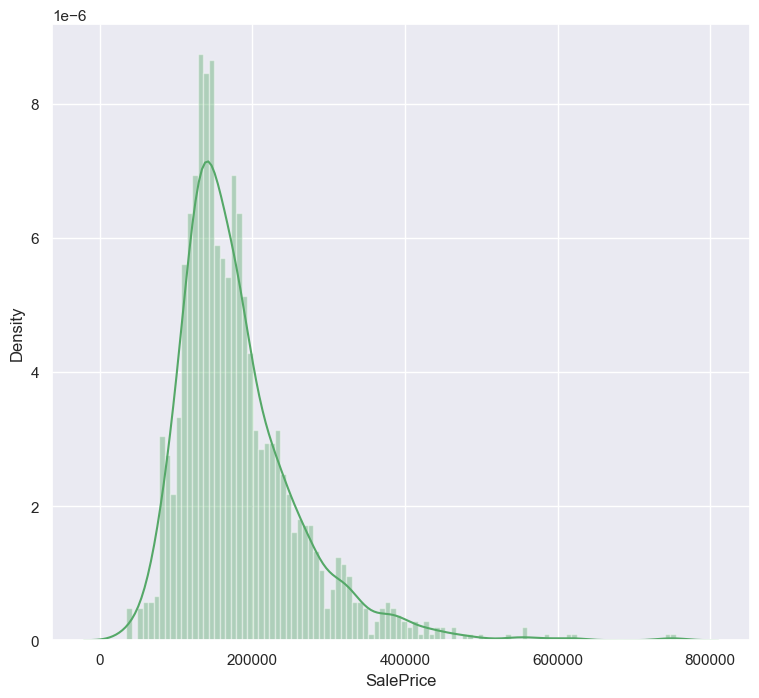

In [184]:
print(df['SalePrice'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(df['SalePrice'], color='g', bins=100, hist_kws={'alpha': 0.4});

In [185]:
list(set(df.dtypes.tolist()))

[dtype('int64'), dtype('O'), dtype('float64')]

## Numerical data distribution

In [186]:
list(set(df.dtypes.tolist()))

[dtype('int64'), dtype('O'), dtype('float64')]

In [187]:
df_num = df.select_dtypes(include = ['float64', 'int64'])
df_num.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000


In [188]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 37 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   LotFrontage    1201 non-null   float64
 2   LotArea        1460 non-null   int64  
 3   OverallQual    1460 non-null   int64  
 4   OverallCond    1460 non-null   int64  
 5   YearBuilt      1460 non-null   int64  
 6   YearRemodAdd   1460 non-null   int64  
 7   MasVnrArea     1452 non-null   float64
 8   BsmtFinSF1     1460 non-null   int64  
 9   BsmtFinSF2     1460 non-null   int64  
 10  BsmtUnfSF      1460 non-null   int64  
 11  TotalBsmtSF    1460 non-null   int64  
 12  1stFlrSF       1460 non-null   int64  
 13  2ndFlrSF       1460 non-null   int64  
 14  LowQualFinSF   1460 non-null   int64  
 15  GrLivArea      1460 non-null   int64  
 16  BsmtFullBath   1460 non-null   int64  
 17  BsmtHalfBath   1460 non-null   int64  
 18  FullBath

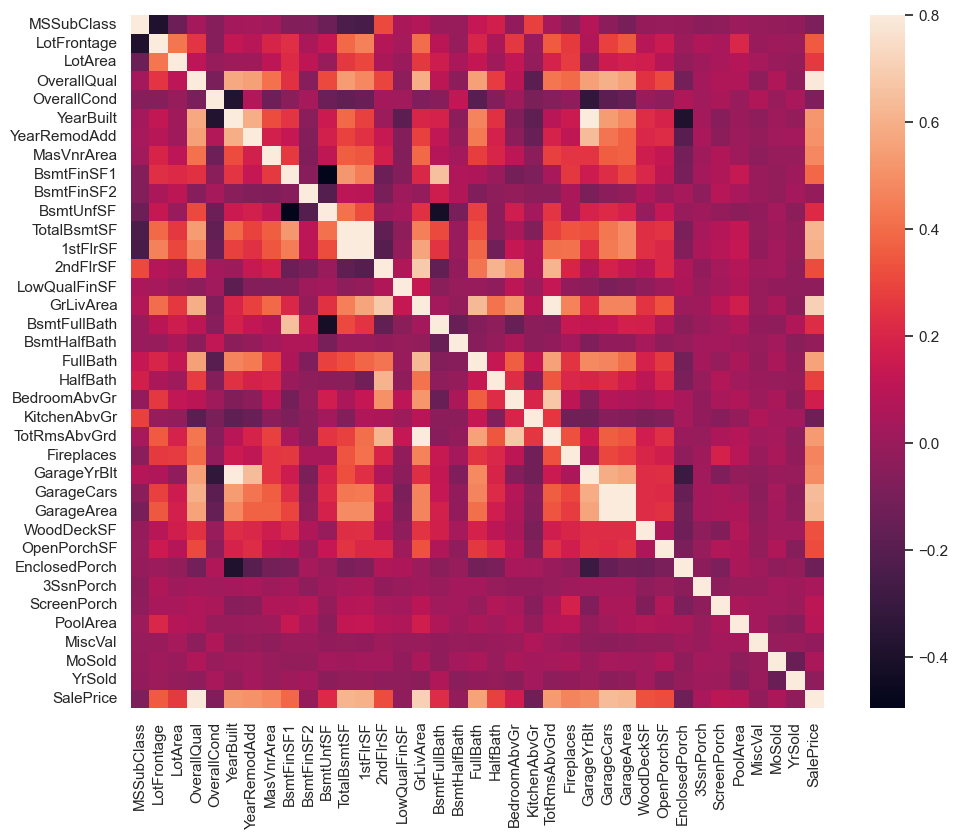

In [189]:
#correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

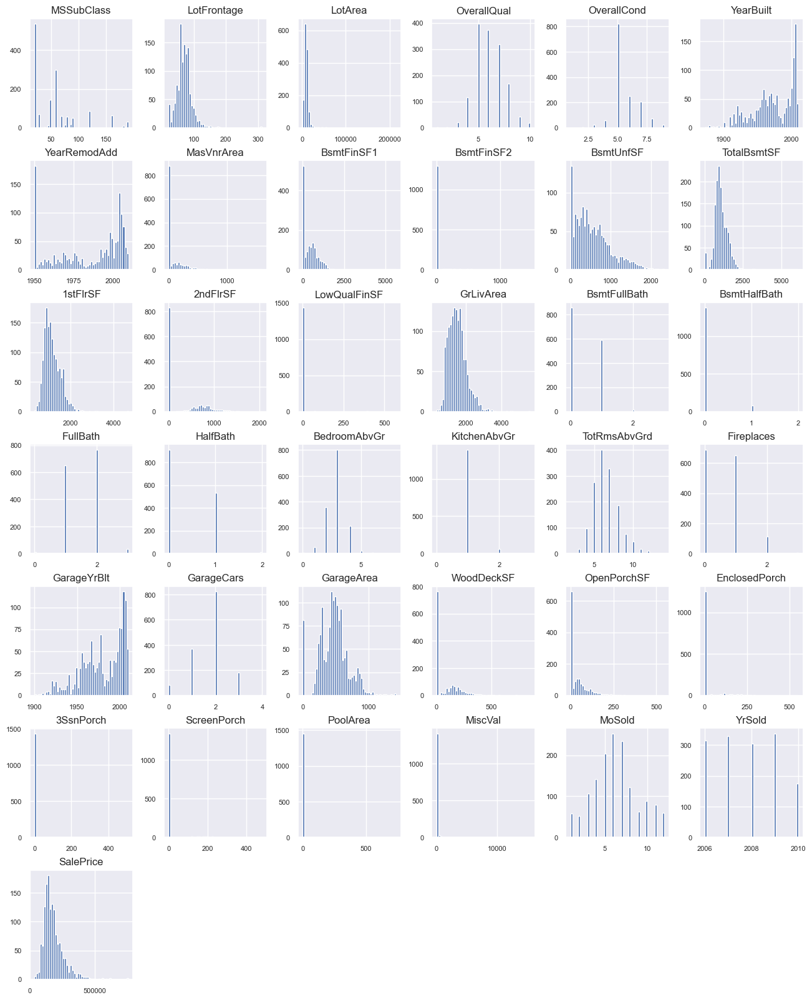

In [190]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

In [191]:
df_num_corr = df_num.corr()['SalePrice'][:-1] # -1 because the latest row is SalePrice
best_numerical_features_list = df_num_corr[abs(df_num_corr) > 0.4].sort_values(ascending=False)
print("There is {} strongly correlated values with SalePrice:\n{}".format(len(best_numerical_features_list), best_numerical_features_list))

There is 13 strongly correlated values with SalePrice:
OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
GarageYrBlt     0.486362
MasVnrArea      0.477493
Fireplaces      0.466929
Name: SalePrice, dtype: float64


In [192]:
['MasVnrArea', 'BsmtFinSF1', 'GarageYrBlt', 'YearRemodAdd', 'YearBuilt', 'TotRmsAbvGrd', 'FullBath', '1stFlrSF', 'GarageArea', 'TotalBsmtSF', 'GarageCars', '2ndFlrSF', 'GrLivArea', 'OverallQual']

['MasVnrArea',
 'BsmtFinSF1',
 'GarageYrBlt',
 'YearRemodAdd',
 'YearBuilt',
 'TotRmsAbvGrd',
 'FullBath',
 '1stFlrSF',
 'GarageArea',
 'TotalBsmtSF',
 'GarageCars',
 '2ndFlrSF',
 'GrLivArea',
 'OverallQual']

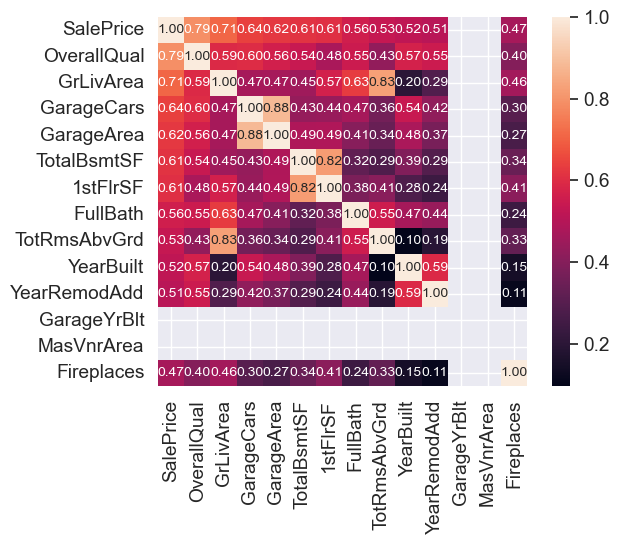

In [193]:
#saleprice correlation matrix
k = 14 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()


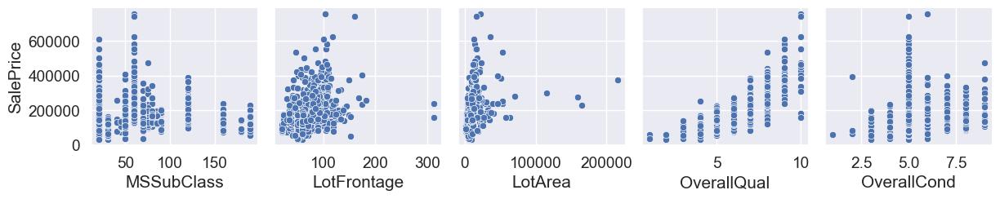

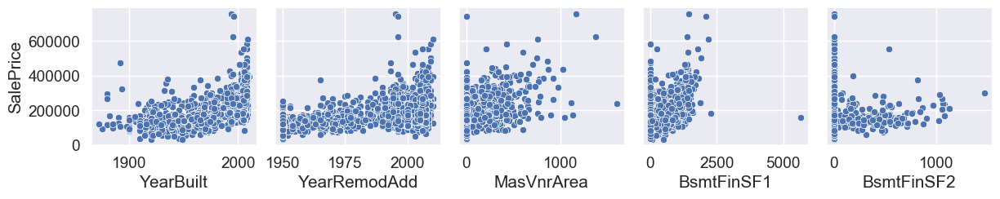

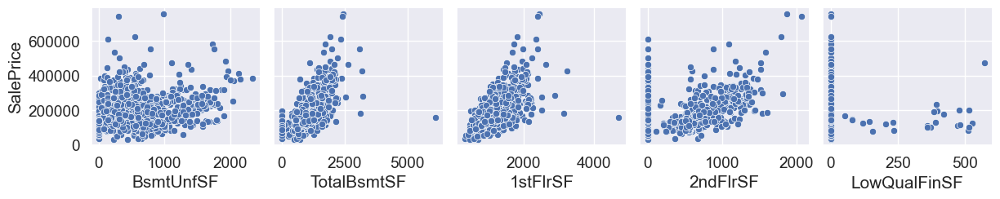

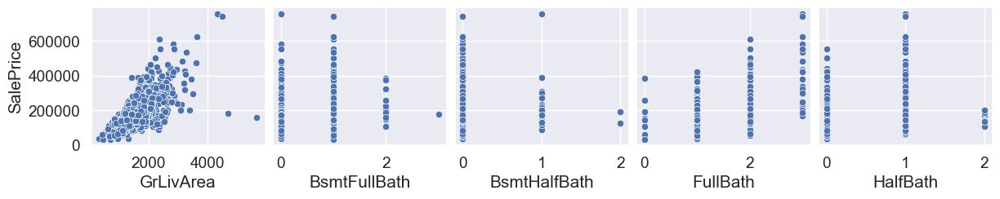

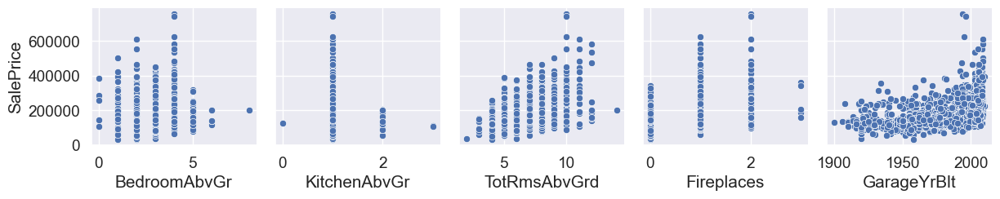

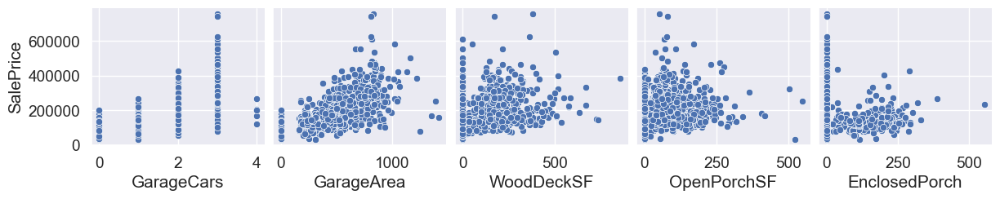

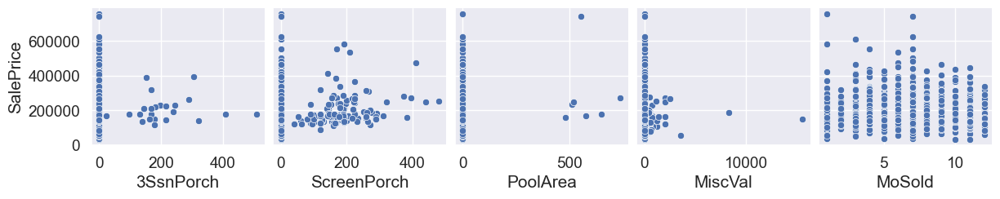

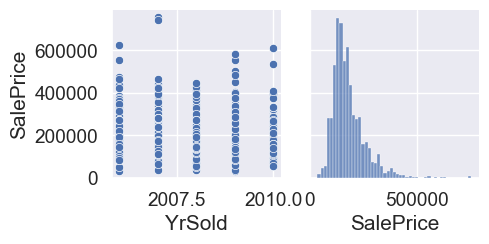

In [194]:
for i in range(0, len(df_num.columns), 5):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+5],
                y_vars=['SalePrice'])

- we can see that a lot of data points are located on x = 0 which may indicate the absence of such feature in the house.

In [195]:
individual_features_df = [
    df_num[[col, 'SalePrice']].loc[df_num[col] != 0]
    for col in df_num.columns[:-1]
]

In [196]:
correlations = {}
for feature_df in individual_features_df:
    col_name = feature_df.columns[0]
    correlation = feature_df[col_name].corr(feature_df['SalePrice'])
    correlations[col_name] = correlation

sorted_correlations = sorted(correlations.items(), key=lambda x: x[1])

for key, value in sorted_correlations:
    print(f"{key:>15}: {value:>15}")

   KitchenAbvGr: -0.1392006921778581
       HalfBath: -0.084391711271799
     MSSubClass: -0.08428413512659524
    OverallCond: -0.07785589404867806
         YrSold: -0.028922585168730402
   BsmtHalfBath: -0.028834567185481722
       PoolArea: -0.014091521506356936
   BsmtFullBath: 0.011439163340408669
         MoSold: 0.046432245223819384
      3SsnPorch: 0.06393243256889079
    OpenPorchSF: 0.08645298857147725
        MiscVal: 0.08896338917298922
     Fireplaces: 0.12166058421363928
      BsmtUnfSF: 0.16926100049514184
   BedroomAbvGr: 0.18093669310848828
     WoodDeckSF: 0.1937060123752067
     BsmtFinSF2: 0.19895609430836594
  EnclosedPorch: 0.24127883630117508
    ScreenPorch: 0.2554300795487841
        LotArea: 0.2638433538714056
   LowQualFinSF: 0.30007501655501334
    LotFrontage: 0.3517990965706781
     MasVnrArea: 0.4340902197568927
     BsmtFinSF1: 0.4716904265235731
    GarageYrBlt: 0.48636167748786074
   YearRemodAdd: 0.5071009671113864
      YearBuilt: 0.5228973328794971


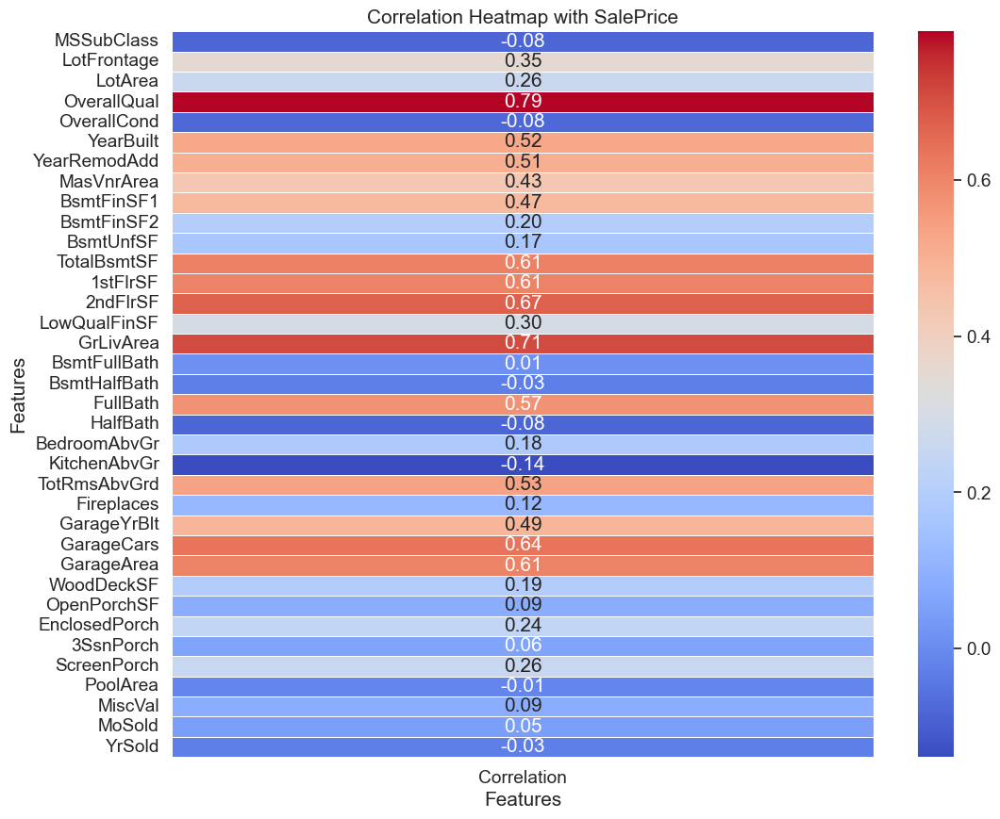

In [197]:
correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])

# Create a heatmap using seaborn
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.xlabel('Features')
plt.ylabel('Features')
plt.title('Correlation Heatmap with SalePrice')
plt.show()

In [198]:
best_numerical_features_list = [key for key, value in sorted_correlations if abs(value) >= 0.4]
print("There is {} strongly correlated values with SalePrice:\n{}".format(len(best_numerical_features_list), best_numerical_features_list))

There is 14 strongly correlated values with SalePrice:
['MasVnrArea', 'BsmtFinSF1', 'GarageYrBlt', 'YearRemodAdd', 'YearBuilt', 'TotRmsAbvGrd', 'FullBath', '1stFlrSF', 'GarageArea', 'TotalBsmtSF', 'GarageCars', '2ndFlrSF', 'GrLivArea', 'OverallQual']


In [199]:
best_numerical_features_list =['MasVnrArea', 'BsmtFinSF1', 'GarageYrBlt', 'YearRemodAdd', 'YearBuilt', 'TotRmsAbvGrd', 'FullBath', '1stFlrSF', 'GarageArea', 'TotalBsmtSF', 'GarageCars', '2ndFlrSF', 'GrLivArea', 'OverallQual','SalePrice']
df_best_num = df.loc[:, best_numerical_features_list].copy()

In [200]:
df_best_num.head(10)

,MasVnrArea,BsmtFinSF1,GarageYrBlt,YearRemodAdd,YearBuilt,TotRmsAbvGrd,FullBath,1stFlrSF,GarageArea,TotalBsmtSF,GarageCars,2ndFlrSF,GrLivArea,OverallQual,SalePrice
0,196.0,706,2003.0,2003,2003,8,2,856,548,856,2,854,1710,7,208500
1,0.0,978,1976.0,1976,1976,6,2,1262,460,1262,2,0,1262,6,181500
2,162.0,486,2001.0,2002,2001,6,2,920,608,920,2,866,1786,7,223500
3,0.0,216,1998.0,1970,1915,7,1,961,642,756,3,756,1717,7,140000
4,350.0,655,2000.0,2000,2000,9,2,1145,836,1145,3,1053,2198,8,250000
5,0.0,732,1993.0,1995,1993,5,1,796,480,796,2,566,1362,5,143000
6,186.0,1369,2004.0,2005,2004,7,2,1694,636,1686,2,0,1694,8,307000
7,240.0,859,1973.0,1973,1973,7,2,1107,484,1107,2,983,2090,7,200000
8,0.0,0,1931.0,1950,1931,8,2,1022,468,952,2,752,1774,7,129900
9,0.0,851,1939.0,1950,1939,5,1,1077,205,991,1,0,1077,5,118000


## Feature to Feature relationship¶


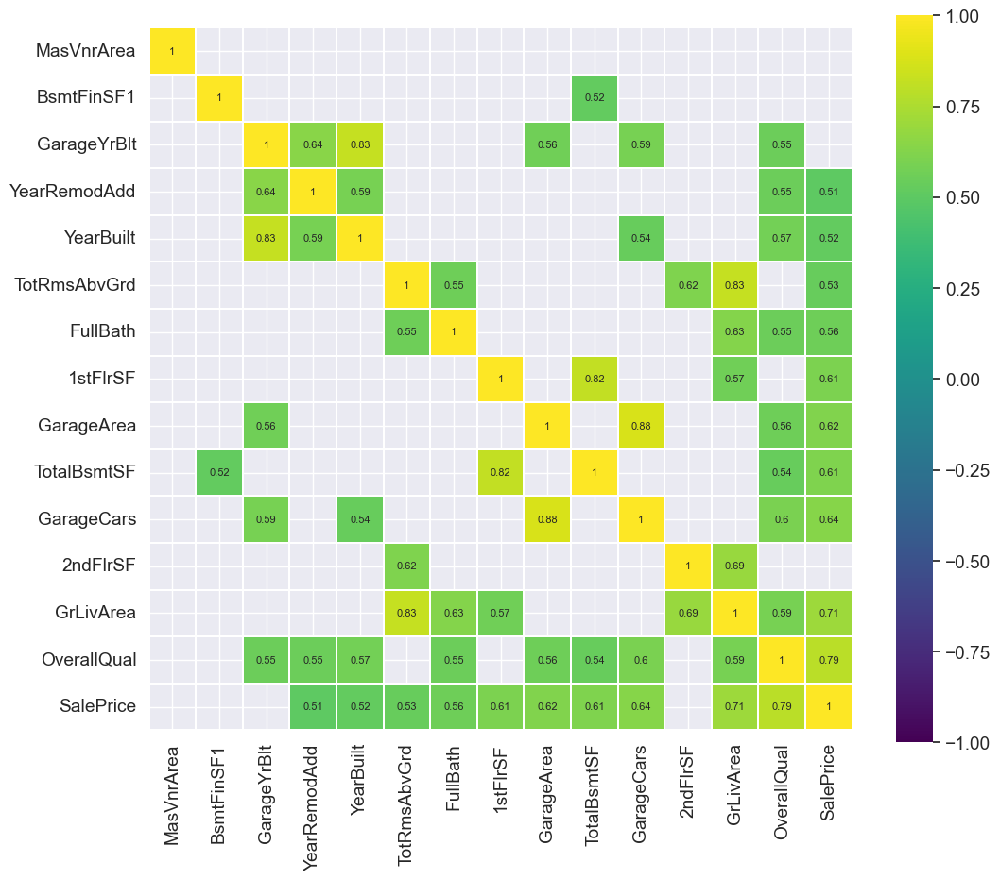

In [201]:
corr = df_best_num.corr() # We already examined SalePrice correlations
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

In [202]:
df_best_num = df_best_num.drop(["GarageYrBlt", "GarageArea", "2ndFlrSF", "TotalBsmtSF","TotRmsAbvGrd"], axis=1)


feature with high correlation between each other are selected and removed the feature with the lowest correlation respect to the sales price

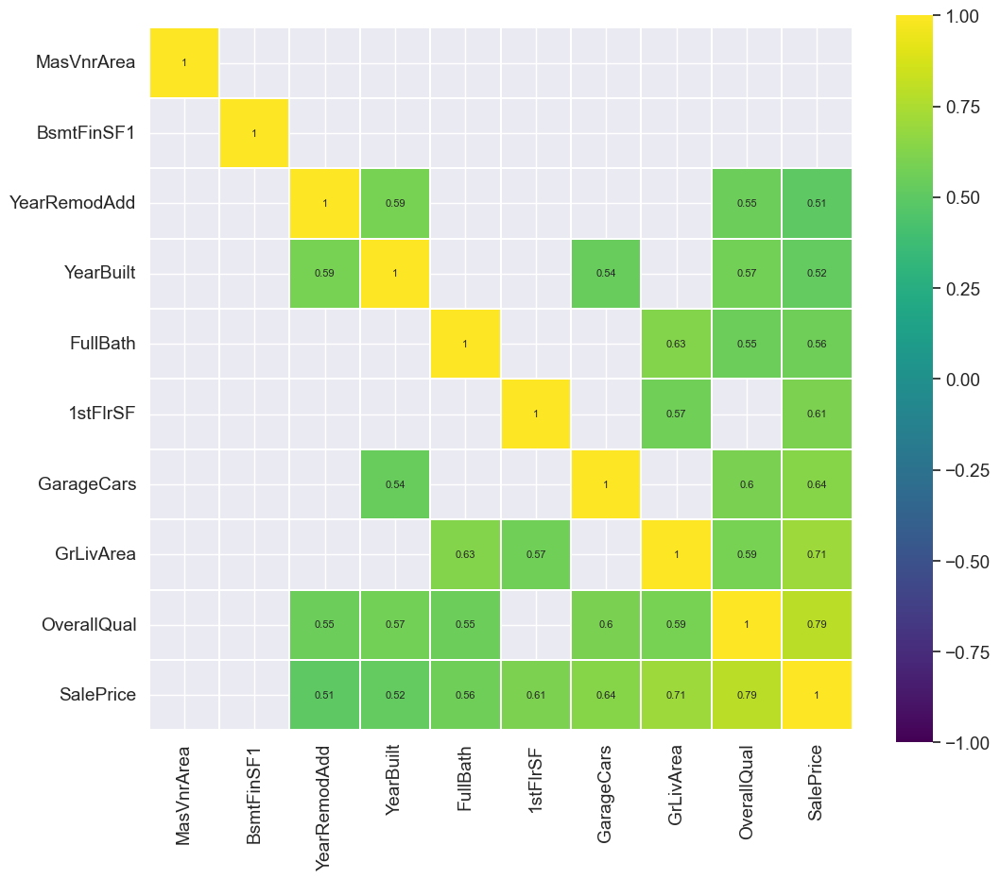

In [203]:
corr = df_best_num.corr() # We already examined SalePrice correlations
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

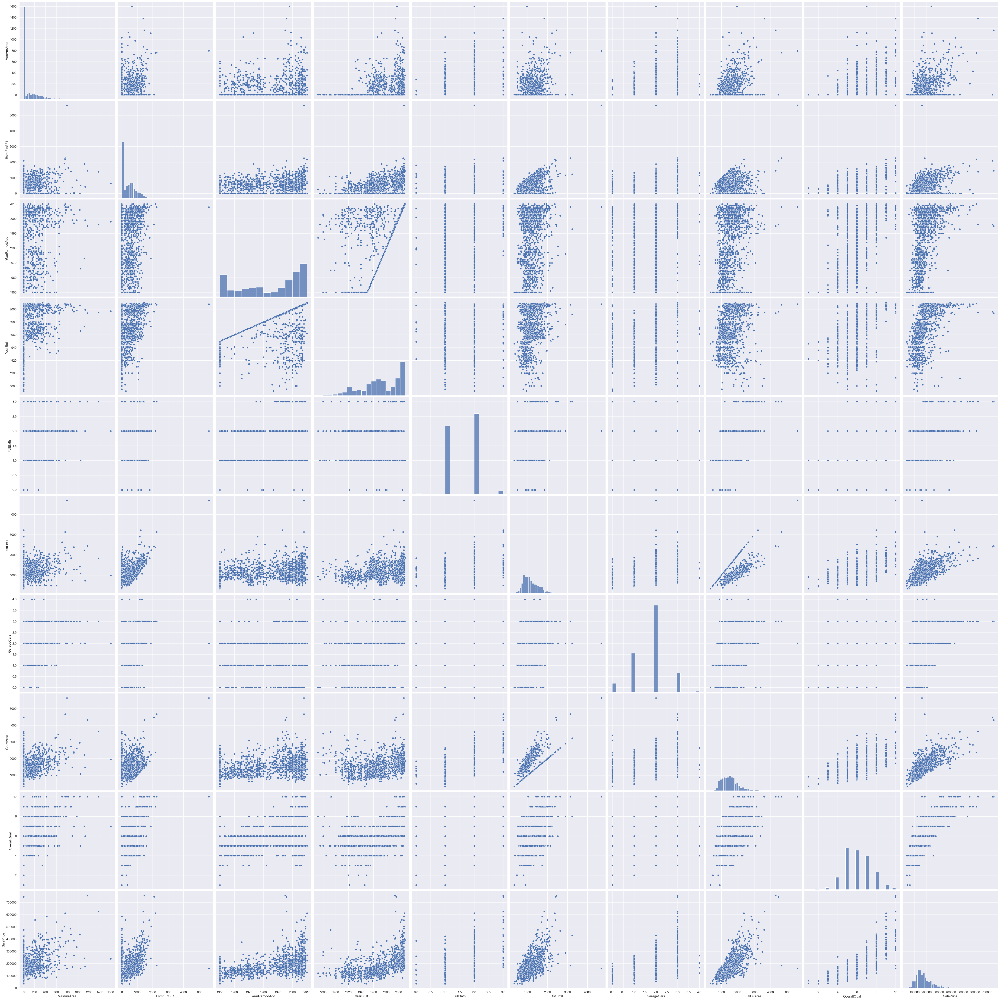

In [204]:
sns.set()
sns.pairplot(df_best_num, size = 5)
plt.show();

In [205]:
df_best_num.isna().sum()

MasVnrArea      8
BsmtFinSF1      0
YearRemodAdd    0
YearBuilt       0
FullBath        0
1stFlrSF        0
GarageCars      0
GrLivArea       0
OverallQual     0
SalePrice       0
dtype: int64

In [206]:
# Assuming df is your DataFrame with missing values
# Replace NaNs with np.nan to indicate missing values (fancyimpute requires np.nan)
df_best_num[df_best_num.isnull()] = np.nan

# Perform KNN regression imputation
knn_imputer = KNN(k=5)  # You can adjust the number of neighbors (k) as needed
df_imputed = knn_imputer.fit_transform(df_best_num)

# Convert the result back to a DataFrame (if necessary)
df_best_num = pd.DataFrame(df_imputed, columns=df_best_num.columns)

Imputing row 1/1460 with 0 missing, elapsed time: 0.177
Imputing row 101/1460 with 0 missing, elapsed time: 0.177
Imputing row 201/1460 with 0 missing, elapsed time: 0.177
Imputing row 301/1460 with 0 missing, elapsed time: 0.177
Imputing row 401/1460 with 0 missing, elapsed time: 0.178
Imputing row 501/1460 with 0 missing, elapsed time: 0.178
Imputing row 601/1460 with 0 missing, elapsed time: 0.178
Imputing row 701/1460 with 0 missing, elapsed time: 0.178
Imputing row 801/1460 with 0 missing, elapsed time: 0.178
Imputing row 901/1460 with 0 missing, elapsed time: 0.178
Imputing row 1001/1460 with 0 missing, elapsed time: 0.179
Imputing row 1101/1460 with 0 missing, elapsed time: 0.179
Imputing row 1201/1460 with 0 missing, elapsed time: 0.179
Imputing row 1301/1460 with 0 missing, elapsed time: 0.179
Imputing row 1401/1460 with 0 missing, elapsed time: 0.179


In [207]:
df_best_num.isna().sum()

MasVnrArea      0
BsmtFinSF1      0
YearRemodAdd    0
YearBuilt       0
FullBath        0
1stFlrSF        0
GarageCars      0
GrLivArea       0
OverallQual     0
SalePrice       0
dtype: int64

null values were imputed using KNN

## categorical data 

In [208]:
df_catg = df.select_dtypes(include = ['O'])
df_catg.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


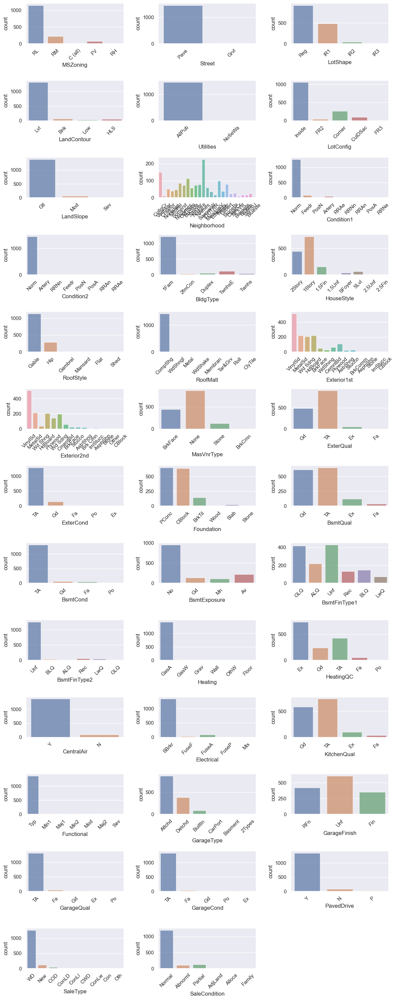

In [209]:
# Assuming df_catg is your DataFrame with non-numerical columns
columns = df_catg.columns
num_columns = len(columns)

# Calculate the number of rows and columns needed for subplots
num_rows = (num_columns + 2) // 3
num_cols = min(num_columns, 3)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 30))

# Loop through columns and create countplots
for i, ax in enumerate(axes.flatten()):
    if i < num_columns:
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        sns.countplot(x=columns[i], alpha=0.7, data=df_catg, ax=ax)

# Remove any empty subplots
for i in range(num_columns, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

fig.tight_layout()
plt.show()


In [210]:
 import pandas as pd

# Assuming df_categorical is your DataFrame with categorical columns
threshold = 0.70  # Define the threshold (70% in this case)

# Calculate the percentage of the most frequent category in each column
category_counts = df_catg.apply(lambda col: col.value_counts().max() / len(col))

# Filter columns where the most frequent category exceeds the threshold
unrelevant_columns = category_counts[category_counts > threshold].index
relevant_columns = category_counts[category_counts < threshold].index

# # Select only the columns that meet the threshold
# df_filtered_categorical = df_categorical[columns_to_keep]



In [211]:
for column in unrelevant_columns:
    counts = df_catg[column].value_counts()
    print(f"Column: {column}")
    print(counts)
    print("\n")

Column: MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


Column: Street
Pave    1454
Grvl       6
Name: Street, dtype: int64


Column: LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64


Column: Utilities
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64


Column: LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64


Column: LandSlope
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64


Column: Condition1
Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64


Column: Condition2
Norm      1445
Feedr        6
Artery       2
RRNn         2
PosN         2
PosA         1
RRAn         1
RRAe         1
Name: Condition2, dtype: int64


Column: BldgType
1Fam      1220
TwnhsE     11

In [212]:
df_catg = df_catg[relevant_columns]

In [213]:
for column in relevant_columns:
    counts = df_catg[column].value_counts()
    print(f"Column: {column}")
    print(counts)
    print("\n")

Column: LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64


Column: Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64


Column: HouseStyle
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64


Column: Exterior1st
VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: Exterior1st, dtype: int64


Column: Exterior2nd
VinylSd    504

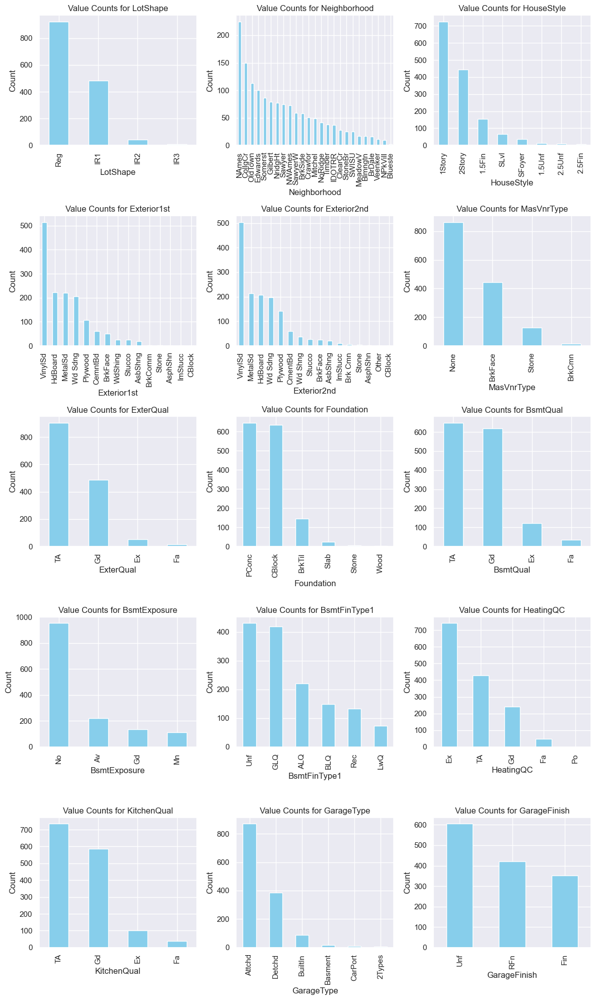

In [214]:
import matplotlib.pyplot as plt

# Assuming df_filtered_categorical contains the filtered categorical columns
num_plots = len(relevant_columns)
num_cols_per_row = 3  # Number of plots per row

# Calculate the number of rows needed
num_rows = (num_plots + num_cols_per_row - 1) // num_cols_per_row

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols_per_row, figsize=(12, 4 * num_rows))

# Flatten the axes array to iterate through
axes = axes.flatten()

for i, column in enumerate(relevant_columns):
    counts = df_catg[column].value_counts()
    
    # Create a bar plot on the current subplot
    counts.plot(kind='bar', color='skyblue', ax=axes[i])
    
    # Set labels and title
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Value Counts for {column}')

# Remove any empty subplots
for i in range(num_plots, num_rows * num_cols_per_row):
    fig.delaxes(axes[i])

# Adjust layout and show the plot
fig.tight_layout()
plt.show()


for the "Neighborhood" column, we can make the following observations:

This column represents different neighborhood names.
It is a categorical variable because it contains distinct categories (neighborhood names) without any inherent order and to avoid high dimensionality we will drop it

In [215]:
df_catg = df_catg.drop('Neighborhood', axis=1)

Since "Exterior1st" and "Exterior2nd" are both nominal categorical variables representing different types of exterior covering materials for houses, and there is a significant overlap in the categories and counts between these two columns we will Create a Binary Indicator Column to reduce dimensionality and the information from both columns is redundant

In [216]:
for material in df_catg['Exterior1st'].unique():
    df_catg[f'Has_{material}_Exterior'] = (df_catg['Exterior1st'] == material) | (df_catg['Exterior2nd'] == material)
df_catg.drop(['Exterior1st', 'Exterior2nd'], axis=1, inplace=True)

In [217]:
df_catg["Has_VinylSd_Exterior"].value_counts()

False    943
True     517
Name: Has_VinylSd_Exterior, dtype: int64

In [218]:
df_catg["Has_MetalSd_Exterior"].value_counts()


False    1238
True      222
Name: Has_MetalSd_Exterior, dtype: int64

In [219]:
df_catg["Has_Wd Sdng_Exterior"].value_counts()


False    1234
True      226
Name: Has_Wd Sdng_Exterior, dtype: int64

In [220]:
df_catg["Has_HdBoard_Exterior"].value_counts()


False    1224
True      236
Name: Has_HdBoard_Exterior, dtype: int64

In [221]:
df_catg["Has_BrkFace_Exterior"].value_counts()

False    1409
True       51
Name: Has_BrkFace_Exterior, dtype: int64

In [222]:
df_catg["Has_WdShing_Exterior"].value_counts()

False    1434
True       26
Name: Has_WdShing_Exterior, dtype: int64

In [223]:
df_catg["Has_CemntBd_Exterior"].value_counts()

False    1399
True       61
Name: Has_CemntBd_Exterior, dtype: int64

In [224]:
df_catg["Has_Plywood_Exterior"].value_counts()

False    1306
True      154
Name: Has_Plywood_Exterior, dtype: int64

In [225]:
df_catg["Has_AsbShng_Exterior"].value_counts()

False    1437
True       23
Name: Has_AsbShng_Exterior, dtype: int64

In [226]:
df_catg["Has_Stucco_Exterior"].value_counts()

False    1429
True       31
Name: Has_Stucco_Exterior, dtype: int64

In [227]:
df_catg["Has_BrkComm_Exterior"].value_counts()

False    1458
True        2
Name: Has_BrkComm_Exterior, dtype: int64

In [228]:
df_catg["Has_AsphShn_Exterior"].value_counts()

False    1457
True        3
Name: Has_AsphShn_Exterior, dtype: int64

In [229]:
df_catg["Has_CBlock_Exterior"].value_counts()

False    1459
True        1
Name: Has_CBlock_Exterior, dtype: int64

In [230]:
df_catg["Has_ImStucc_Exterior"].value_counts()

False    1450
True       10
Name: Has_ImStucc_Exterior, dtype: int64

In [231]:
df_catg = df_catg.drop('Has_BrkFace_Exterior', axis=1)
df_catg = df_catg.drop('Has_WdShing_Exterior', axis=1)
df_catg = df_catg.drop('Has_CemntBd_Exterior', axis=1)
df_catg = df_catg.drop('Has_Plywood_Exterior', axis=1)
df_catg = df_catg.drop('Has_AsbShng_Exterior', axis=1)
df_catg = df_catg.drop('Has_Stucco_Exterior', axis=1)
df_catg = df_catg.drop('Has_BrkComm_Exterior', axis=1)
df_catg = df_catg.drop('Has_AsphShn_Exterior', axis=1)
df_catg = df_catg.drop('Has_ImStucc_Exterior', axis=1)
df_catg = df_catg.drop('Has_CBlock_Exterior', axis=1)
df_catg = df_catg.drop('Has_Stone_Exterior', axis=1)



we will drop these colunms because 90% of them is false 

In [232]:
df_catg.isna().sum()

LotShape                 0
HouseStyle               0
MasVnrType               8
ExterQual                0
Foundation               0
BsmtQual                37
BsmtExposure            38
BsmtFinType1            37
HeatingQC                0
KitchenQual              0
GarageType              81
GarageFinish            81
Has_VinylSd_Exterior     0
Has_MetalSd_Exterior     0
Has_Wd Sdng_Exterior     0
Has_HdBoard_Exterior     0
dtype: int64

In [233]:
df_catg["MasVnrType"].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

in "MasVnrType" column, it appears that the value "None" is used to represent null values.more than 50% of the colunm is null so we will drop it

In [234]:
df_catg = df_catg.drop('MasVnrType', axis=1)

In [235]:
df_catg['BsmtQual'].fillna(df_catg['BsmtQual'].mode()[0], inplace=True)
df_catg["BsmtQual"].value_counts()

TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [236]:
df_catg['BsmtExposure'].fillna(df_catg['BsmtExposure'].mode()[0], inplace=True)
df_catg["BsmtExposure"].value_counts()

No    991
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

In [237]:
df_catg['BsmtFinType1'].fillna(df_catg['BsmtFinType1'].mode()[0], inplace=True)
df_catg["BsmtFinType1"].value_counts()

Unf    467
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

In [238]:
df_catg['GarageType'].fillna(df_catg['GarageType'].mode()[0], inplace=True)
df_catg["GarageType"].value_counts()

Attchd     951
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [239]:
df_catg['GarageFinish'].fillna(df_catg['GarageFinish'].mode()[0], inplace=True)
df_catg["GarageFinish"].value_counts()

Unf    686
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [240]:
df_catg.isna().sum()

LotShape                0
HouseStyle              0
ExterQual               0
Foundation              0
BsmtQual                0
BsmtExposure            0
BsmtFinType1            0
HeatingQC               0
KitchenQual             0
GarageType              0
GarageFinish            0
Has_VinylSd_Exterior    0
Has_MetalSd_Exterior    0
Has_Wd Sdng_Exterior    0
Has_HdBoard_Exterior    0
dtype: int64

In [241]:
df = pd.concat([df_catg, df_best_num],axis=1)

## outliers

In [242]:
df

,LotShape,HouseStyle,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,...,MasVnrArea,BsmtFinSF1,YearRemodAdd,YearBuilt,FullBath,1stFlrSF,GarageCars,GrLivArea,OverallQual,SalePrice
0,Reg,2Story,Gd,PConc,Gd,No,GLQ,Ex,Gd,Attchd,...,196.0,706.0,2003.0,2003.0,2.0,856.0,2.0,1710.0,7.0,208500.0
1,Reg,1Story,TA,CBlock,Gd,Gd,ALQ,Ex,TA,Attchd,...,0.0,978.0,1976.0,1976.0,2.0,1262.0,2.0,1262.0,6.0,181500.0
2,IR1,2Story,Gd,PConc,Gd,Mn,GLQ,Ex,Gd,Attchd,...,162.0,486.0,2002.0,2001.0,2.0,920.0,2.0,1786.0,7.0,223500.0
3,IR1,2Story,TA,BrkTil,TA,No,ALQ,Gd,Gd,Detchd,...,0.0,216.0,1970.0,1915.0,1.0,961.0,3.0,1717.0,7.0,140000.0
4,IR1,2Story,Gd,PConc,Gd,Av,GLQ,Ex,Gd,Attchd,...,350.0,655.0,2000.0,2000.0,2.0,1145.0,3.0,2198.0,8.0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,Reg,2Story,TA,PConc,Gd,No,Unf,Ex,TA,Attchd,...,0.0,0.0,2000.0,1999.0,2.0,953.0,2.0,1647.0,6.0,175000.0
1456,Reg,1Story,TA,CBlock,Gd,No,ALQ,TA,TA,Attchd,...,119.0,790.0,1988.0,1978.0,2.0,2073.0,2.0,2073.0,6.0,210000.0
1457,Reg,2Story,Ex,Stone,TA,No,GLQ,Ex,Gd,Attchd,...,0.0,275.0,2006.0,1941.0,2.0,1188.0,1.0,2340.0,7.0,266500.0
1458,Reg,1Story,TA,CBlock,TA,Mn,GLQ,Gd,Gd,Attchd,...,0.0,49.0,1996.0,1950.0,1.0,1078.0,1.0,1078.0,5.0,142125.0


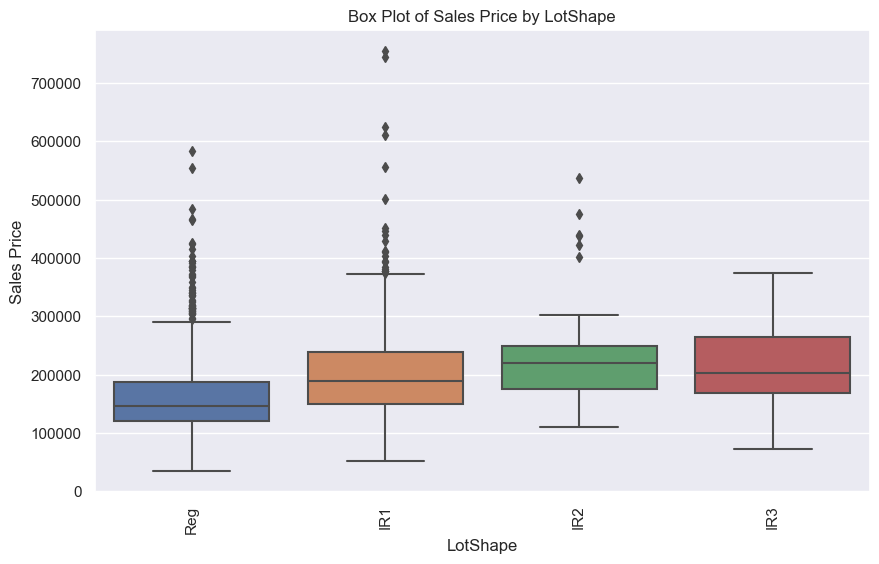

In [243]:
categorical_column = 'LotShape'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


- In the analysis of house data, we have identified four types of lot shapes: Regular (Reg), Slightly irregular (IR1), Moderately irregular (IR2), and Irregular (IR3). Intuitively, one might expect that houses with Regular lot shapes (essentially rectangles) would generally have higher prices compared to those with Irregular shapes since regular shapes are often considered more desirable. Our analysis supports this expectation, as seen in the box plot.


- However, there are some exceptions to this trend. Specifically, there are instances of IR1 and IR2 lot shapes with significantly high prices. These outliers might initially seem surprising, but upon further consideration, we can rationalize these observations. Here's a simple data analysis interpretation:


- Outliers: The presence of high-priced IR1 and IR2 properties suggests that other factors, aside from lot shape, influence house prices significantly. These factors could include location, size, amenities, or condition of the house. These high-priced irregular properties might possess features that compensate for their non-regular lot shape.


- Not Necessarily Outliers: While these high-priced IR1 and IR2 properties appear as outliers on the box plot, they might not necessarily be statistical outliers. In some cases, the price difference between Regular and Slightly Irregular (IR1) or Moderately Irregular (IR2) lots could be reasonable when considering these other influential factors.

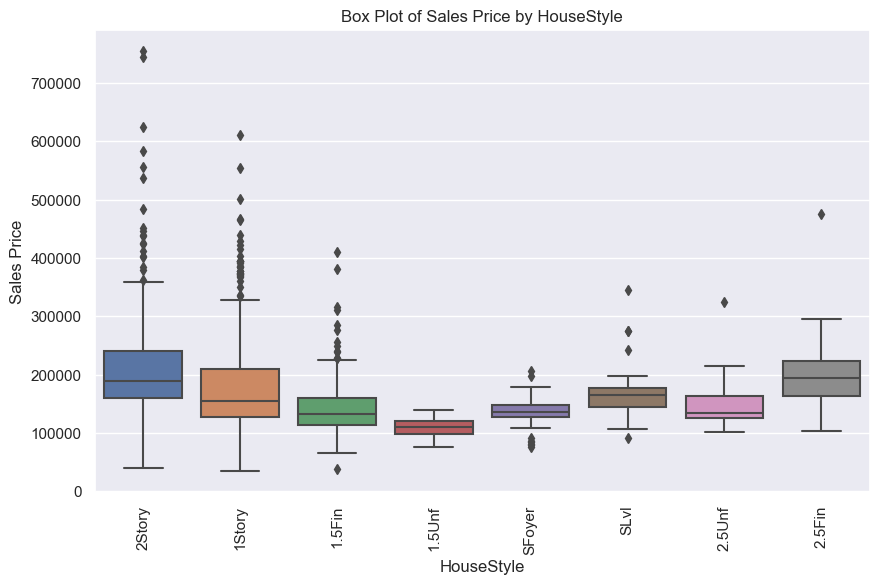

In [244]:
categorical_column = 'HouseStyle'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


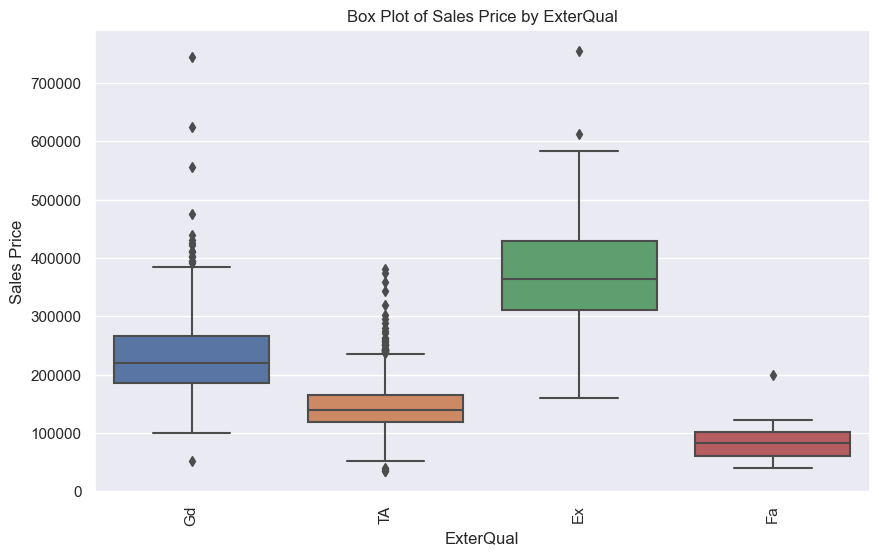

In [245]:
categorical_column = 'ExterQual'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


we've examined the "ExterQual" column, which describes the quality of the exterior material of houses. The column contains the following values with their respective counts:

Typical/Average (TA): 906
Good (Gd): 488
Excellent (Ex): 52
Fair (Fa): 14
Common sense suggests that houses with excellent exterior quality (Ex) would generally have higher prices compared to those with fair quality (Fa), and this trend is confirmed by our box plot. However, we've also noticed some outliers that require attention:

- High-Priced Good Quality (Gd) Houses: There are instances of houses with "Good" exterior quality (Gd) that have exceptionally high prices, comparable to those with "Excellent" quality (Ex). These high-priced Gd houses can be considered outliers, as the difference in exterior quality between Gd and Ex does not seem substantial enough to justify such a significant price increase.

- Low-Priced Average Quality (TA) Houses: Surprisingly, there are houses with "Typical/Average" exterior quality (TA) that have prices lower than those with "Fair" quality (Fa). These low-priced TA houses are also outliers, as it is unexpected for houses with a higher quality rating (TA) to have lower prices than those with a lower quality rating (Fa).

In summary, our analysis reveals that while there is a general correlation between exterior quality and house prices (higher quality tends to lead to higher prices), there are outliers that deviate from this pattern. Specifically, some "Good" quality houses have prices comparable to "Excellent" quality houses, and some "Typical/Average" quality houses have prices lower than "Fair" quality houses.



In [246]:
df = df[~((df['ExterQual'] == 'TA') & (df['SalePrice'] < 60000))]
df = df[~((df['ExterQual'] == 'Gd') & (df['SalePrice'] > 500000))]

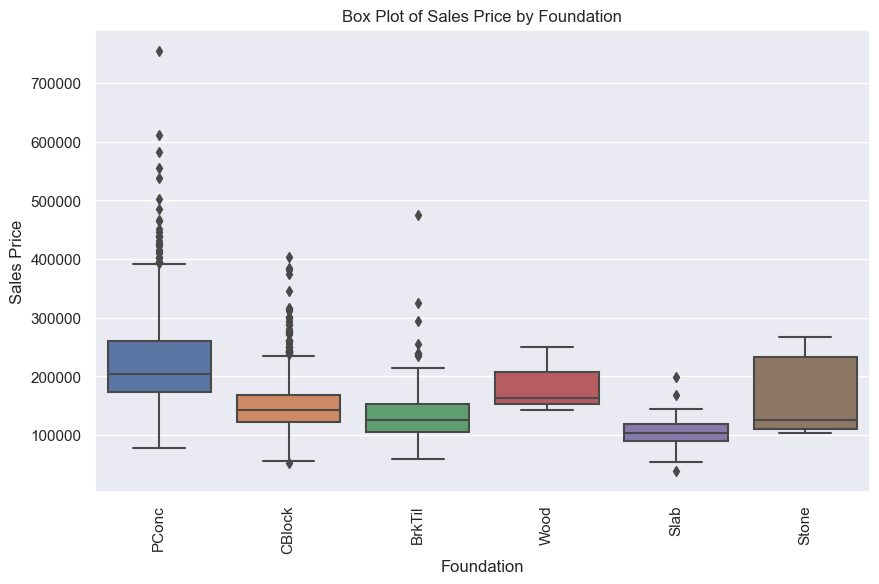

In [247]:
categorical_column = 'Foundation'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


In our analysis of house data, we've examined the "Foundation" column, which represents the type of foundation used in houses. The column contains the following values with their respective counts:

Poured Concrete (PConc): 647

Concrete Block (CBlock): 634

Brick & Tile (BrkTil): 146

Slab (Slab): 24

Stone (Stone): 6

Wood (Wood): 3

Common sense suggests that houses with a Poured Concrete (PConc) foundation would generally have higher prices compared to those with a Slab foundation, and this trend is confirmed by our box plot. However, we've also noticed some outliers that require attention:

- High-Priced Brick & Tile (BrkTil) Foundations: There are instances of houses with a "Brick & Tile" foundation (BrkTil) that have exceptionally high prices, comparable to those with a "Poured Concrete" foundation (PConc). These high-priced BrkTil houses can be considered outliers, as the difference in foundation type between BrkTil and PConc does not seem substantial enough to justify such a significant price increase.

In [248]:
df = df[~((df['Foundation'] == 'BrkTil') & (df['SalePrice'] > 400000))]

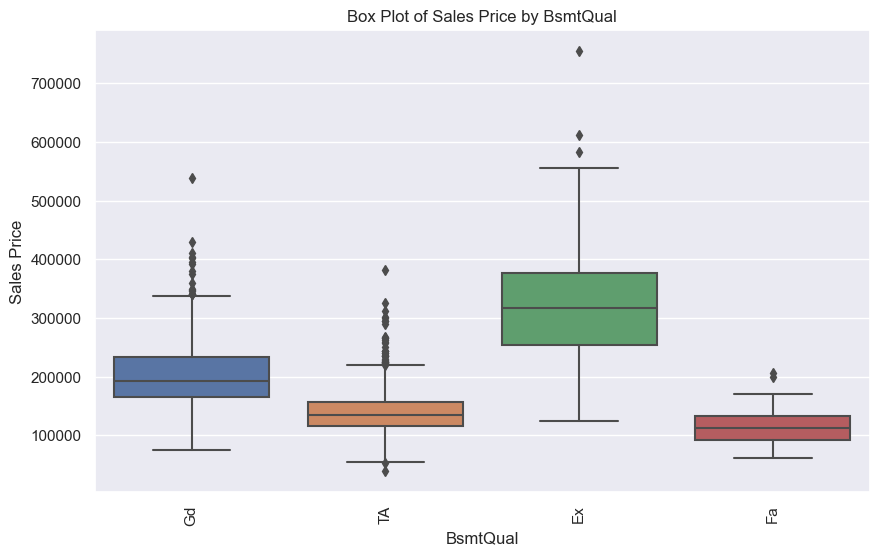

In [249]:
categorical_column = 'BsmtQual'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


the "BsmtQual" column indicates the quality of exterior materials, with categories: Typical/Average (TA), Good (Gd), Excellent (Ex), and Fair (Fa).

Our box plot confirm that "Excellent" quality generally leads to higher house prices than "Fair" quality. However, we've noticed:

- High-Priced "Good" Quality (Gd): Some "Good" quality houses have exceptionally high prices, akin to "Excellent" quality houses. we can consider it reasonable.

- Outliers with High-Priced "Fair" Quality (Fa): Conversely, certain "Fair" quality houses have unexpectedly high prices, similar to "Good" quality houses. These are also outliers as the quality difference doesn't explain the price.

In [250]:
df = df[~((df['BsmtQual'] == 'Fa') & (df['SalePrice'] > 200000))]

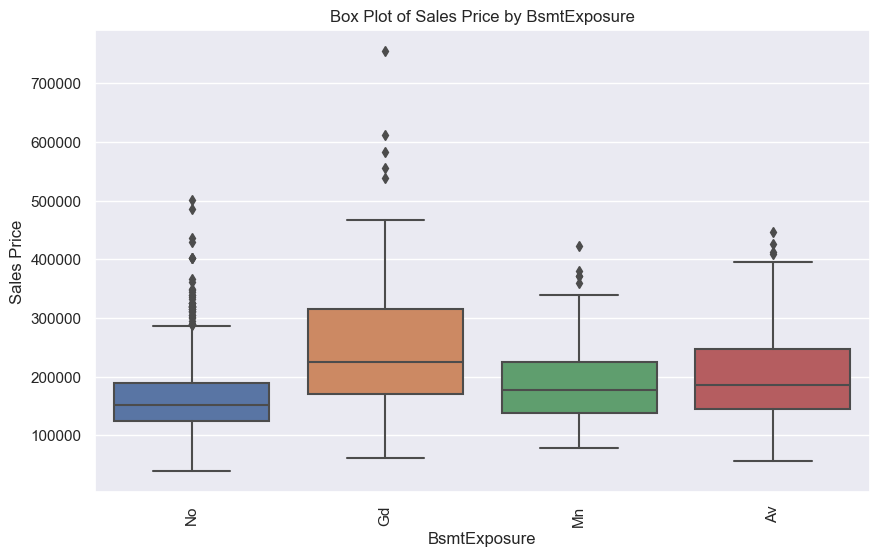

In [251]:
categorical_column = 'BsmtExposure'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


 the "BsmtExposure" column, which describes the basement exposure in houses. Here's the breakdown of the data:

No Exposure (No): 953

Average Exposure (Av): 221

Good Exposure (Gd): 134

Minimum Exposure (Mn): 114

Our analysis reveals that houses with "Good Exposure" (Gd) basements tend to command higher prices than those with "No Exposure" (No). However, there are noteworthy outliers where some "No Exposure" and "Minimum Exposure" (Mn) basements exhibit surprisingly high prices, which appear unreasonable given their exposure levels

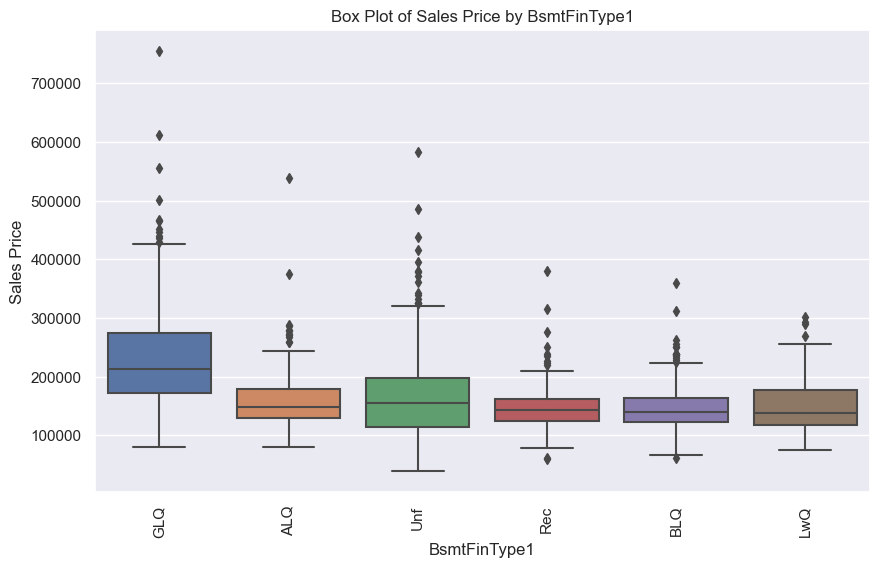

In [252]:
categorical_column = 'BsmtFinType1'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


we've explored the "BsmtFinType1" column, which describes the quality of the finished area in the basement. Here's a simplified observation:

- Generally, houses with "Good Living Quarters" (GLQ) in the basement tend to have higher prices compared to those with "Low Quality" (LwQ) finished areas, which aligns with our box plot findings.

- However, there are notable outliers among various basement finishing types (BLQ, LwQ, Rec, Unf) that have unexpectedly high prices, similar to GLQ. These outliers appear unreasonable given the quality differences and are considered for further investigation in our analysis.

In [253]:
df = df[~((df['BsmtFinType1'] == 'Unf') & (df['SalePrice'] > 400000))]
df = df[~((df['BsmtFinType1'] == 'BLQ') & (df['SalePrice'] > 300000))]
df = df[~((df['BsmtFinType1'] == 'LWQ') & (df['SalePrice'] > 270000))]
df = df[~((df['BsmtFinType1'] == 'Rec') & (df['SalePrice'] > 300000))]
df = df[~((df['BsmtFinType1'] == 'ALQ') & (df['SalePrice'] > 500000))]


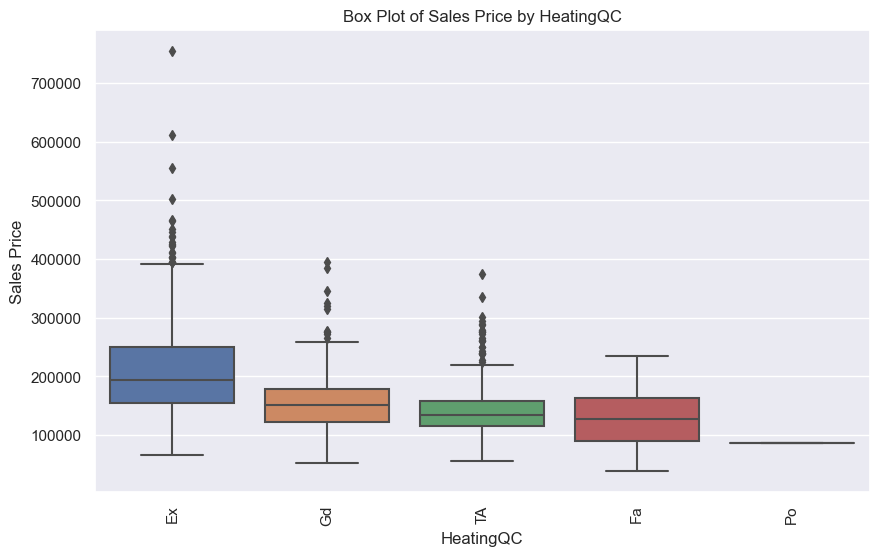

In [254]:
categorical_column = 'HeatingQC'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


the "HeatingQC" column, which indicates the quality and condition of heating in houses. Here's a simplified observation:

- Generally, houses with "Excellent" heating quality (Ex) tend to have higher prices compared to those with "Poor" heating (Po), which is supported by our box plot.

- However, there are instances where houses with "Typical/Average" (TA) and "Good" (Gd) heating quality have relatively high prices. These observations are not considered outliers because the price variation can be reasonably explained by other factors influencing house prices, beyond just heating quality.

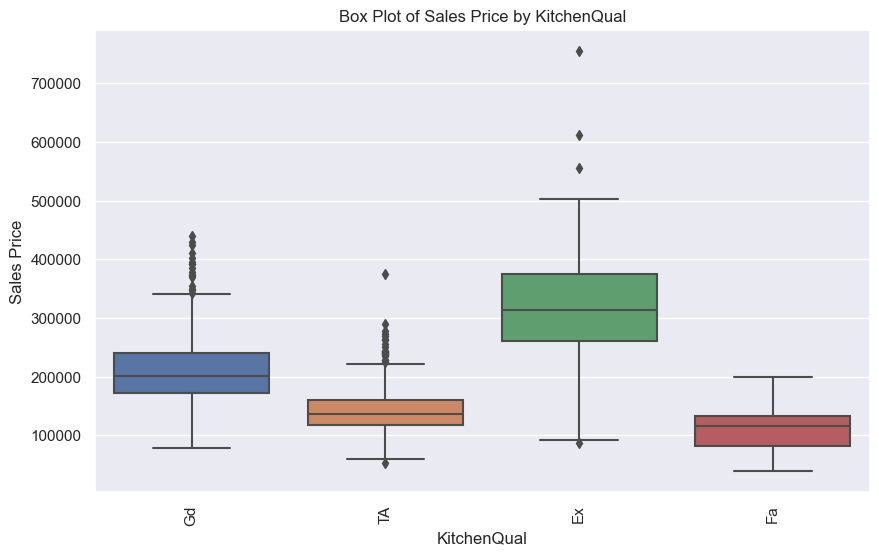

In [255]:
categorical_column = 'KitchenQual'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


In our house data analysis, we've looked at the "KitchenQual" column, representing the quality of kitchens in houses. Here's a simplified observation:

- Generally, houses with "Excellent" kitchen quality (Ex) tend to have higher prices compared to those with "Fair" kitchen quality (Fa), which is evident from the box plot.
- However,Maybe there are outliers where houses with "Excellent" kitchens have surprisingly low prices. These canot be considered as outliers because the price difference cannot be reasonably explained by kitchen quality alone.

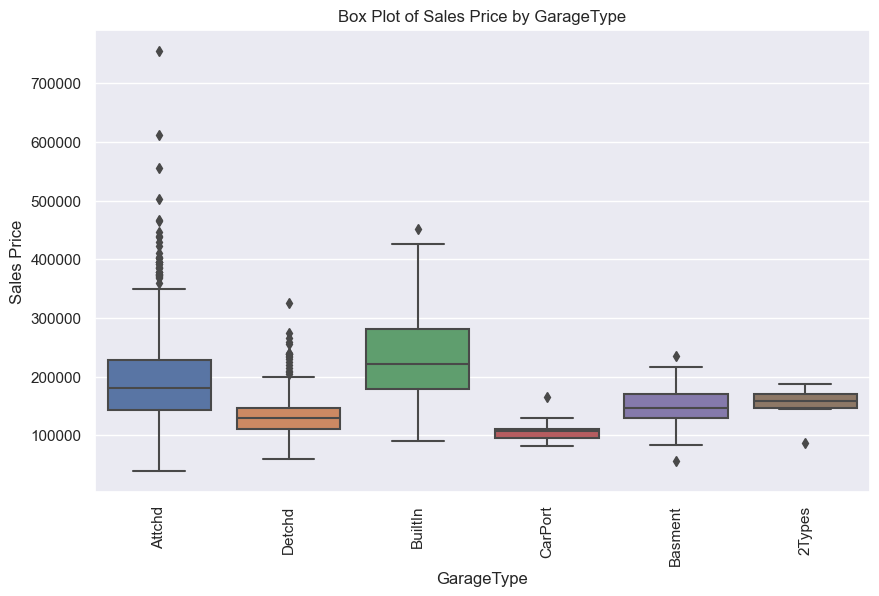

In [256]:
categorical_column = 'GarageType'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


the "GarageType" column, representing various garage types in houses. 
The different garage types tend to have a fairly consistent impact on house prices, as evidenced by their similar mean prices in the box plot.

While there might be a few unusual data points, they don't dramatically disrupt the overall trend. In essence, the choice of garage type doesn't appear to be a major driver of house prices in this dataset.

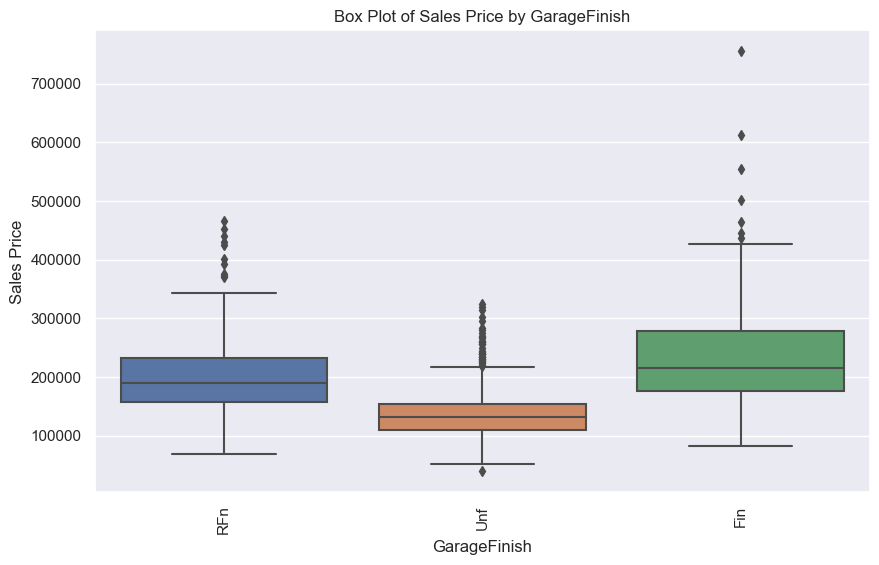

In [257]:
categorical_column = 'GarageFinish'
# Create a box plot using seaborn
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
sns.boxplot(x=categorical_column, y='SalePrice', data=df)
plt.xticks(rotation=90)  # Optional: Rotate x-axis labels for better readability
plt.xlabel(categorical_column)
plt.ylabel('Sales Price')
plt.title('Box Plot of Sales Price by ' + categorical_column)
plt.show()


we've explored the "GarageFinish" column, which represents the interior finish of garages in houses. Here's a straightforward observation:

- Generally, houses with a "Finished" garage interior (Fin) tend to have higher prices compared to those with an "Unfinished" interior (Unf), which is evident in the box plot.
- However, there are outliers where houses with "Rough Finished" (RFn) or "Unfinished" interiors have unusually high prices, similar to those with a "Finished" interior. These outliers are considered because the price differences cannot be reasonably explained by garage interior finish alone, and they appear significantly higher.

In [258]:
df = df[~((df['GarageFinish'] == 'Unf') & (df['SalePrice'] > 350000))]
df = df[~((df['GarageFinish'] == 'RFn') & (df['SalePrice'] > 500000))]


## Does an increase in the masonry veneer area of a property correspond to an increase in its sale price?

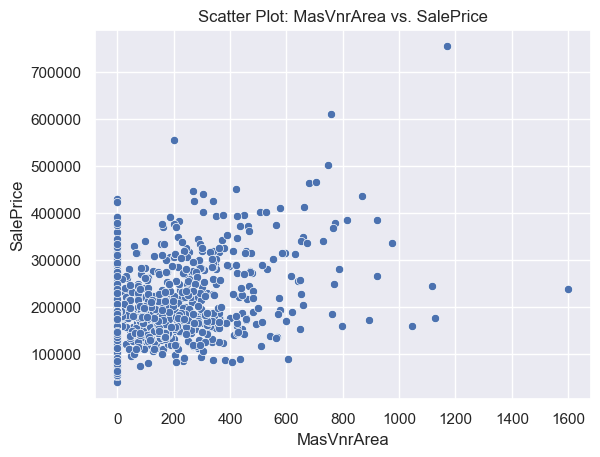

In [259]:
sns.scatterplot(data=df, x='MasVnrArea', y='SalePrice')
plt.title('Scatter Plot: MasVnrArea vs. SalePrice')
plt.show()

There is a positive correlation between the "MasVnrArea" and house prices, as indicated by the scatter plot. In general, as the masonry veneer area increases, house prices tend to increase.


However, it's important to note that there are outliers where properties have a high "MasVnrArea" but relatively low prices. These outliers are worth considering since the price difference for such cases cannot be reasonably explained by the masonry veneer area alone, and they appear significantly lower than expected based on the trend observed in the scatter plot.


In [260]:
df = df[~((df['MasVnrArea'] > 1000) & (df['SalePrice'] > 300000))]

## Does a Larger Finished Basement Increase Home Prices?

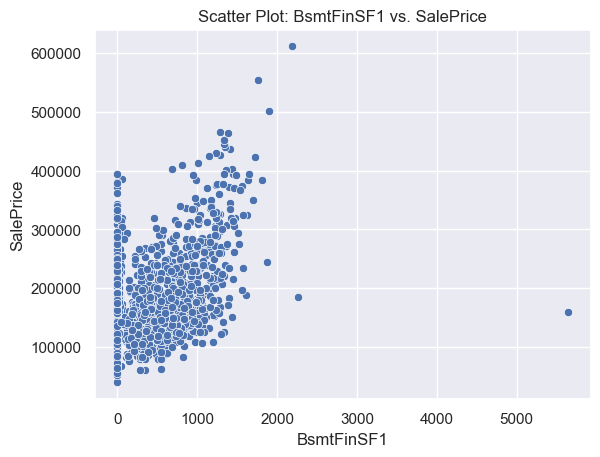

In [261]:
sns.scatterplot(data=df, x='BsmtFinSF1', y='SalePrice')
plt.title('Scatter Plot: BsmtFinSF1 vs. SalePrice')
plt.show()

we've observed a positive correlation between the 'BsmtFinSF1' (finished basement square footage) and house prices, as evident from the scatter plot. In general, as the finished basement area increases, house prices tend to increase. This observation underscores the notion that larger finished basement areas are associated with higher house prices, and this relationship is supported by the visual evidence provided by the scatter plot."

In [262]:
df = df[~((df['BsmtFinSF1'] > 5000) & (df['SalePrice'] < 200000))]

## What is the relation between the square footage of the first floor and price ?

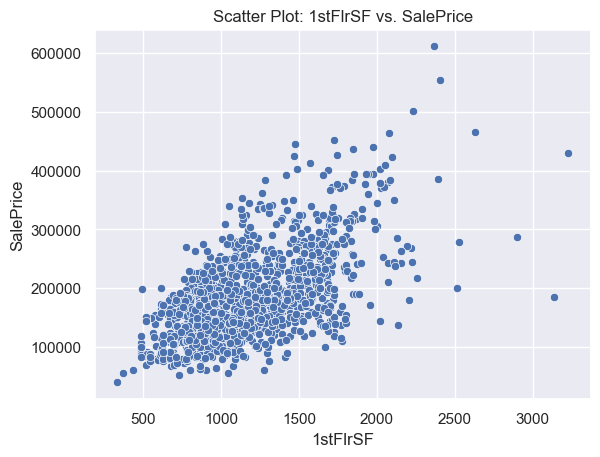

In [263]:
sns.scatterplot(data=df, x='1stFlrSF', y='SalePrice')
plt.title('Scatter Plot: 1stFlrSF vs. SalePrice')
plt.show()

There is a positive correlation between the "1stFlrSF" and house prices, as indicated by the scatter plot. In general, as the square footage of the first floor, house prices tend to increase.


However, it's important to note that there are outliers where properties have a high "1stFlrSF" but relatively low prices. These outliers are worth considering since the price difference for such cases cannot be reasonably.

In [264]:
df = df[~((df['BsmtFinSF1'] > 3000) & (df['SalePrice'] > 200000))]

## Does time affect the price?

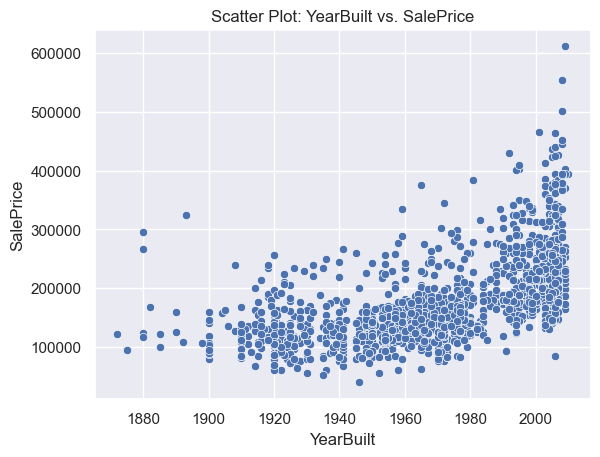

In [265]:
sns.scatterplot(data=df, x='YearBuilt', y='SalePrice')
plt.title('Scatter Plot: YearBuilt vs. SalePrice')
plt.show()

 that property prices tend to rise as the construction year of the property increases. This price trend over the years can be attributed to factors such as inflation and the increasing value of real estate over time.

## How does GrLivArea affect price?


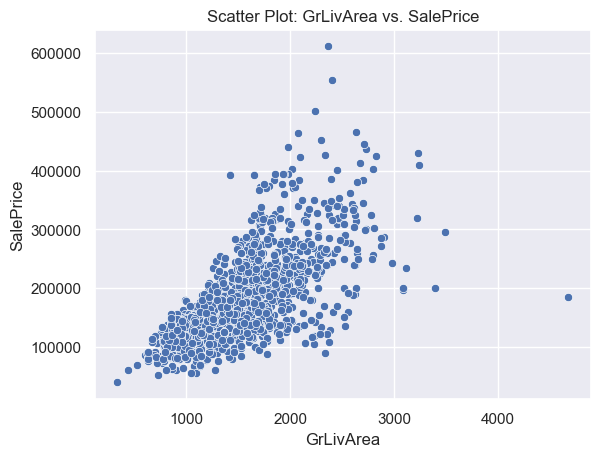

In [266]:
sns.scatterplot(data=df, x='GrLivArea', y='SalePrice')
plt.title('Scatter Plot: GrLivArea vs. SalePrice')
plt.show()

When the area (size) of a house increases, the price of the house also tends to increase. So, properties with a very low price but a very large area could be considered unusual and stand out as outliers.

In [267]:
df = df[~((df['GrLivArea'] > 4000) & (df['SalePrice'] < 200000))]

## outliers in the most important feature! 

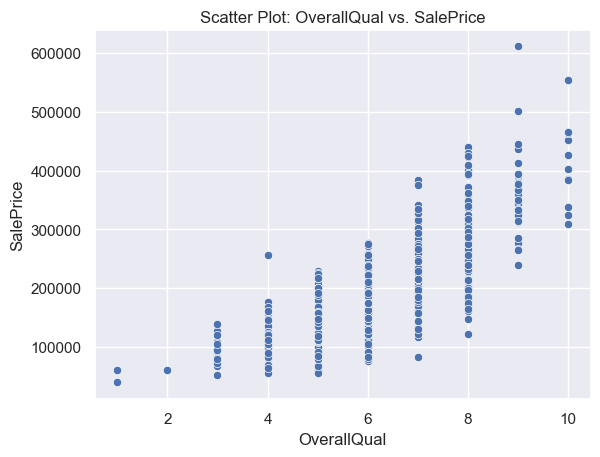

In [268]:
sns.scatterplot(data=df, x='OverallQual', y='SalePrice')
plt.title('Scatter Plot: OverallQual vs. SalePrice')
plt.show()

It's uncommon to find a house that is exceptionally large and has high overall quality at a very low price. In fact, such a combination is often considered impossible

In [269]:
df = df[~((df['OverallQual'] > 8) & (df['SalePrice'] < 250000))]

In [270]:
df.reset_index(drop=True, inplace=True)
df.select_dtypes(include = ['O','bool'])

,LotShape,HouseStyle,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,Has_VinylSd_Exterior,Has_MetalSd_Exterior,Has_Wd Sdng_Exterior,Has_HdBoard_Exterior
0,Reg,2Story,Gd,PConc,Gd,No,GLQ,Ex,Gd,Attchd,RFn,True,False,False,False
1,Reg,1Story,TA,CBlock,Gd,Gd,ALQ,Ex,TA,Attchd,RFn,False,True,False,False
2,IR1,2Story,Gd,PConc,Gd,Mn,GLQ,Ex,Gd,Attchd,RFn,True,False,False,False
3,IR1,2Story,TA,BrkTil,TA,No,ALQ,Gd,Gd,Detchd,Unf,False,False,True,False
4,IR1,2Story,Gd,PConc,Gd,Av,GLQ,Ex,Gd,Attchd,RFn,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,Reg,2Story,TA,PConc,Gd,No,Unf,Ex,TA,Attchd,RFn,True,False,False,False
1430,Reg,1Story,TA,CBlock,Gd,No,ALQ,TA,TA,Attchd,Unf,False,False,False,False
1431,Reg,2Story,Ex,Stone,TA,No,GLQ,Ex,Gd,Attchd,RFn,False,False,False,False
1432,Reg,1Story,TA,CBlock,TA,Mn,GLQ,Gd,Gd,Attchd,Unf,False,True,False,False


**Categorical Data:**
- `Foundation`,`GarageType`; *Nominal*
  
  

- `HouseStyle`,`LotShape`,`GarageFinish`,`ExterQual`,`BsmtQual`,`BsmtExposure`,`BsmtFinType1`,`HeatingQC`.`KitchenQual`; *Ordinal*
-  `Has_VinylSd_Exterior`,`Has_MetalSd_Exterior`, `Has_HdBoard_Exterior`,  `Has_Stone_Exterior`,`Has_Wd Sdng_Exterior`;Boolean

## Encoding

#### Nominal

In [271]:
df["Foundation"].value_counts()

PConc     634
CBlock    627
BrkTil    140
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64

In [272]:
def buk_Foundation(x):
    check = ['PConc','CBlock','BrkTil']
    if x in check:
        return x
    else:
        return "others"
df["Foundation"]= pd.DataFrame(map(buk_Foundation,df["Foundation"]))

In [273]:
Foundation=pd.get_dummies(df["Foundation"],drop_first=True)
df=pd.concat([df,Foundation],axis=1)
df = df.drop('Foundation', axis=1)

In [274]:
df["GarageType"].value_counts()

Attchd     939
Detchd     381
BuiltIn     81
Basment     18
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [275]:
def buk_GarageType(x):
    check = ['Attchd','Detchd']
    if x in check:
        return x
    else:
        return "other"
df["GarageType"]= pd.DataFrame(map(buk_GarageType,df["GarageType"]))

In [276]:
GarageType=pd.get_dummies(df["GarageType"],drop_first=True)
df=pd.concat([df,GarageType],axis=1)
df = df.drop('other', axis=1)
df = df.drop('GarageType', axis=1)

#### Ordinal

In [277]:
order_qual = ["Fa", "TA", "Gd", "Ex"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df[["ExterQual"]])

OrdinalEncoder(categories=[['Fa', 'TA', 'Gd', 'Ex']])

In [278]:
df["ExterQual"]=pd.DataFrame(qual_label.transform(df[["ExterQual"]]))

In [279]:
qual_label.fit(df[["BsmtQual"]])


OrdinalEncoder(categories=[['Fa', 'TA', 'Gd', 'Ex']])

In [280]:
df["BsmtQual"]=pd.DataFrame(qual_label.transform(df[["BsmtQual"]]))

In [281]:
qual_label.fit(df[["KitchenQual"]])


OrdinalEncoder(categories=[['Fa', 'TA', 'Gd', 'Ex']])

In [282]:
df["KitchenQual"]=pd.DataFrame(qual_label.transform(df[["KitchenQual"]]))


In [283]:
order_BsmtExposure = ["No", "Mn", "Av", "Gd"]
BsmtExposure_label=OrdinalEncoder(categories=[order_BsmtExposure])
BsmtExposure_label.fit(df[["BsmtExposure"]])


OrdinalEncoder(categories=[['No', 'Mn', 'Av', 'Gd']])

In [284]:
df["BsmtExposure"]=pd.DataFrame(BsmtExposure_label.transform(df[["BsmtExposure"]]))


In [285]:
order_BsmtFinType1 = ["Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"]
BsmtFinType1_label=OrdinalEncoder(categories=[order_BsmtFinType1])
BsmtFinType1_label.fit(df[["BsmtFinType1"]])


OrdinalEncoder(categories=[['Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ']])

In [286]:
df["BsmtFinType1"]=pd.DataFrame(BsmtFinType1_label.transform(df[["BsmtFinType1"]]))


In [287]:
order_GarageFinish = ["Unf", "RFn", "Fin"]
GarageFinish_label=OrdinalEncoder(categories=[order_GarageFinish])
GarageFinish_label.fit(df[["GarageFinish"]])


OrdinalEncoder(categories=[['Unf', 'RFn', 'Fin']])

In [288]:
df["GarageFinish"]=pd.DataFrame(GarageFinish_label.transform(df[["GarageFinish"]]))

In [289]:
order_LotShape = ["IR3", "IR2", "IR1", "Reg"]
LotShape_label=OrdinalEncoder(categories=[order_LotShape])
LotShape_label.fit(df[["LotShape"]])


OrdinalEncoder(categories=[['IR3', 'IR2', 'IR1', 'Reg']])

In [290]:
df["LotShape"]=pd.DataFrame(LotShape_label.transform(df[["LotShape"]]))

In [291]:
order_HouseStyle = ["1.5Unf", "1Story", "1.5Fin", "2.5Unf", "SFoyer", "SLvl", "2Story", "2.5Fin"]
HouseStyle_label=OrdinalEncoder(categories=[order_HouseStyle])
HouseStyle_label.fit(df[["HouseStyle"]])


OrdinalEncoder(categories=[['1.5Unf', '1Story', '1.5Fin', '2.5Unf', 'SFoyer',
                            'SLvl', '2Story', '2.5Fin']])

In [292]:
df["HouseStyle"]=pd.DataFrame(HouseStyle_label.transform(df[["HouseStyle"]]))

In [293]:
order_HeatingQC = ["Po", "Fa", "TA", "Gd", "Ex"]
HeatingQC_label=OrdinalEncoder(categories=[order_HeatingQC])
HeatingQC_label.fit(df[["HeatingQC"]])


OrdinalEncoder(categories=[['Po', 'Fa', 'TA', 'Gd', 'Ex']])

In [294]:
df["HeatingQC"]=pd.DataFrame(HeatingQC_label.transform(df[["HeatingQC"]]))

In [295]:
label_encoder = LabelEncoder()

# Fit and transform the boolean column
df['Has_VinylSd_Exterior'] = label_encoder.fit_transform(df['Has_VinylSd_Exterior'])

In [296]:
label_encoder = LabelEncoder()

df['Has_MetalSd_Exterior'] = label_encoder.fit_transform(df['Has_MetalSd_Exterior'])

In [297]:
label_encoder = LabelEncoder()

df['Has_HdBoard_Exterior'] = label_encoder.fit_transform(df['Has_HdBoard_Exterior'])

In [298]:
label_encoder = LabelEncoder()

df['Has_Wd Sdng_Exterior'] = label_encoder.fit_transform(df['Has_Wd Sdng_Exterior'])

In [299]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1434 entries, 0 to 1433
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LotShape              1434 non-null   float64
 1   HouseStyle            1434 non-null   float64
 2   ExterQual             1434 non-null   float64
 3   BsmtQual              1434 non-null   float64
 4   BsmtExposure          1434 non-null   float64
 5   BsmtFinType1          1434 non-null   float64
 6   HeatingQC             1434 non-null   float64
 7   KitchenQual           1434 non-null   float64
 8   GarageFinish          1434 non-null   float64
 9   Has_VinylSd_Exterior  1434 non-null   int64  
 10  Has_MetalSd_Exterior  1434 non-null   int64  
 11  Has_Wd Sdng_Exterior  1434 non-null   int64  
 12  Has_HdBoard_Exterior  1434 non-null   int64  
 13  MasVnrArea            1434 non-null   float64
 14  BsmtFinSF1            1434 non-null   float64
 15  YearRemodAdd         

## Normalization

In [300]:
df_best_num = df_best_num.drop('SalePrice', axis=1)
numerical_column_names = df_best_num.columns.tolist()
numerical_column_names

['MasVnrArea',
 'BsmtFinSF1',
 'YearRemodAdd',
 'YearBuilt',
 'FullBath',
 '1stFlrSF',
 'GarageCars',
 'GrLivArea',
 'OverallQual']

In [301]:
# Create a StandardScaler instance
scaler = StandardScaler()

# Select the numerical columns from the DataFrame
numerical_columns = df[numerical_column_names]

# Fit and transform the scaler on the selected columns
normalized_numerical_columns = scaler.fit_transform(numerical_columns)

# Replace the original columns with the normalized values
df[numerical_column_names] = normalized_numerical_columns

y = df.pop("SalePrice")
x=df
x.columns = x.columns.astype(str)

In [302]:
x

,LotShape,HouseStyle,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageFinish,Has_VinylSd_Exterior,...,YearBuilt,FullBath,1stFlrSF,GarageCars,GrLivArea,OverallQual,CBlock,PConc,others,Detchd
0,3.0,6.0,2.0,2.0,0.0,5.0,4.0,2.0,1.0,1,...,1.053972,0.822340,-0.816700,0.321197,0.447609,0.689469,0,1,0,0
1,3.0,1.0,1.0,2.0,3.0,4.0,4.0,1.0,1.0,0,...,0.152961,0.822340,0.294823,0.321197,-0.492256,-0.057282,1,0,0,0
2,2.0,6.0,2.0,2.0,1.0,5.0,4.0,2.0,1.0,1,...,0.987230,0.822340,-0.641485,0.321197,0.607051,0.689469,0,1,0,0
3,2.0,6.0,1.0,1.0,0.0,4.0,3.0,2.0,0.0,0,...,-1.882656,-1.034723,-0.529237,1.675892,0.462295,0.689469,0,0,0,1
4,2.0,6.0,2.0,2.0,2.0,5.0,4.0,2.0,1.0,1,...,0.953859,0.822340,-0.025493,1.675892,1.471391,1.436221,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,3.0,6.0,1.0,2.0,0.0,0.0,4.0,1.0,1.0,1,...,0.920489,0.822340,-0.551139,0.321197,0.315441,-0.057282,0,1,0,0
1430,3.0,1.0,1.0,2.0,0.0,4.0,2.0,1.0,0.0,0,...,0.219702,0.822340,2.515130,0.321197,1.209152,-0.057282,1,0,0,0
1431,3.0,6.0,3.0,1.0,0.0,5.0,4.0,2.0,1.0,0,...,-1.015016,0.822340,0.092230,-1.033498,1.769295,0.689469,0,0,1,0
1432,3.0,1.0,1.0,1.0,1.0,5.0,3.0,2.0,0.0,0,...,-0.714679,-1.034723,-0.208922,-1.033498,-0.878273,-0.804034,1,0,0,0


##  creat a model that fits the data 

In [303]:
model= []
model_mse = []

In [304]:
 #Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

## Decision Tree

In [305]:
from sklearn.tree import DecisionTreeClassifier
dec_tree = DecisionTreeClassifier()
dec_tree.fit(X_train,y_train)

# Make predictions
dec_tree_y_pred = dec_tree.predict(X_test)

# Assuming y_true and y_pred are your true values and predicted values
mse = mean_squared_error(y_test, dec_tree_y_pred)

# Print and save the accuracy
print(f"Decision Tree Mean Squared Error: {mse}")
model.append("Decision Tree")
model_mse.append(mse)

Decision Tree Mean Squared Error: 1700677545.1498258


## Linear Regression

In [306]:
from sklearn.linear_model import LinearRegression

lreg = LinearRegression()
lreg.fit(X_train, y_train)

# Make predictions
lreg_y_pred = lreg.predict(X_test)

# Assuming y_true and y_pred are your true values and predicted values
mse = mean_squared_error(y_test, lreg_y_pred)

# Print and save the accuracy
print(f"Linear Regression Mean Squared Error: {mse}")
model.append("Linear Regression")
model_mse.append(mse)

Linear Regression Mean Squared Error: 792585109.3231273


## Gradient Boosting

In [307]:
from sklearn.ensemble import GradientBoostingRegressor
gb_regressor = GradientBoostingRegressor()

# Fit the model to the training data
gb_regressor.fit(X_train, y_train)
# Make predictions on the test data
gb_regressor_y_pred = gb_regressor.predict(X_test)

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, gb_regressor_y_pred)
model.append("Gradient Boosting")
model_mse.append(mse)
print(f"Gradient Boosting Mean Squared Error (MSE): {mse}")

Gradient Boosting Mean Squared Error (MSE): 636531179.6030816


## XGB

In [308]:
xgb_regressor = xgb.XGBRegressor()
# Fit the model to the training data
xgb_regressor.fit(X_train, y_train)

# Make predictions on the test data
xgb_regressor_y_pred = xgb_regressor.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, xgb_regressor_y_pred)
model.append("xgb")
model_mse.append(mse)
print(f"XGB Mean Squared Error (MSE): {mse}")

XGB Mean Squared Error (MSE): 750484545.9551249


## SVR

In [309]:
svr_regressor = svm.SVR(kernel='linear', C=1.0)

# Fit the model to the training data
svr_regressor.fit(X_train, y_train.ravel())  # Note: ravel() is used to convert y_train to a 1D array

# Make predictions on the test data
svr_regressor_y_pred = svr_regressor.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, svr_regressor_y_pred)
model.append("SVR")
model_mse.append(mse)
print(f"SVR Mean Squared Error (MSE): {mse}")

SVR Mean Squared Error (MSE): 4719508668.52742


## Random Forest Regression


In [310]:
rf_regressor = RandomForestRegressor()
# n_estimators=100, random_state=42
# Fit the model to the training data
rf_regressor.fit(X_train, y_train.ravel())  # Note: ravel() is used to convert y_train to a 1D array

# Make predictions on the test data
rf_regressor_y_pred = rf_regressor.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, rf_regressor_y_pred)
model.append(" Random Forest Regression")
model_mse.append(mse)
print(f" Random Forest Regression Mean Squared Error (MSE): {mse}")

 Random Forest Regression Mean Squared Error (MSE): 634495758.1701175


## Ridge Regression

In [311]:
# Create a Ridge Regression model
alpha = 1.0  # Regularization strength (adjust this hyperparameter)
ridge_regressor = Ridge(alpha=alpha)

# Fit the model to the training data
ridge_regressor.fit(X_train, y_train)

# Make predictions on the test data
ridge_regressor_y_pred = ridge_regressor.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, ridge_regressor_y_pred)
model.append(" Ridge Regression")
model_mse.append(mse)

print(f"Ridge Regression Mean Squared Error (MSE): {mse}")

Ridge Regression Mean Squared Error (MSE): 792184339.3980217


##  catboost


In [312]:
from catboost import CatBoostRegressor
# Create and train the CatBoostRegressor model
catboost_model = CatBoostRegressor()
catboost_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = catboost_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
model.append(" CatBoost")
model_mse.append(mse)
# Calculate Mean Squared Error (MSE) on the test set
print(f"CatBoost MSE on Test Set: {mse}")

Learning rate set to 0.04184
0:	learn: 69881.9320998	total: 1.41ms	remaining: 1.4s
1:	learn: 67896.0826800	total: 2.59ms	remaining: 1.29s
2:	learn: 65933.8883319	total: 3.69ms	remaining: 1.23s
3:	learn: 64147.5027817	total: 4.78ms	remaining: 1.19s
4:	learn: 62412.4726057	total: 5.8ms	remaining: 1.16s
5:	learn: 60886.8191125	total: 6.97ms	remaining: 1.15s
6:	learn: 59188.3119234	total: 8.08ms	remaining: 1.15s
7:	learn: 57614.5843337	total: 9.22ms	remaining: 1.14s
8:	learn: 56172.0027428	total: 10.3ms	remaining: 1.14s
9:	learn: 54719.6805333	total: 11.3ms	remaining: 1.12s
10:	learn: 53395.8101388	total: 12.4ms	remaining: 1.11s
11:	learn: 52123.8927838	total: 13.5ms	remaining: 1.11s
12:	learn: 50982.4733122	total: 14.3ms	remaining: 1.08s
13:	learn: 49767.7729557	total: 15.4ms	remaining: 1.08s
14:	learn: 48550.6624025	total: 16.4ms	remaining: 1.08s
15:	learn: 47409.7893290	total: 17.5ms	remaining: 1.07s
16:	learn: 46342.1499354	total: 18.5ms	remaining: 1.07s
17:	learn: 45277.1864065	total:

## LightBGM

In [313]:
params = {
    'objective': 'regression',  # 'regression' for regression tasks
    'boosting_type': 'gbdt',   # Gradient Boosting Decision Tree
    'metric': 'mse',           # Mean Squared Error (MSE) as the evaluation metric
    'num_leaves': 31,          # Number of leaves in each tree
    'learning_rate': 0.05,     # Learning rate
    'feature_fraction': 0.9,  # Fraction of features to be used in each iteration
    'bagging_fraction': 0.8,  # Fraction of data to be used in each iteration (bagging)
    'bagging_freq': 5,         # Frequency of bagging
    'verbose': 0               # Control the level of verbosity (0 for no output)
}

# Train the LightGBM model
num_round = 100  # Number of boosting rounds (iterations)
# Create a LightGBM dataset
train_data = lgb.Dataset(X_train, label=y_train)
bst = lgb.train(params, train_data, num_round)

# Make predictions on the test data
y_pred = bst.predict(X_test, num_iteration=bst.best_iteration)
model.append("lightgbm")
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
model_mse.append(mse)
print(f"lightgbm Mean Squared Error (MSE): {mse}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
lightgbm Mean Squared Error (MSE): 694121902.0070964


## lasso Regression

In [314]:
alpha = 1.0  # Regularization strength (adjust this hyperparameter)
lasso_regressor = Lasso(alpha=alpha)

# Fit the model to the training data
lasso_regressor.fit(X_train, y_train)

# Make predictions on the test data
lasso_regressor_y_pred = lasso_regressor.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, lasso_regressor_y_pred)
model.append(" Lasso Regression")
model_mse.append(mse)

print(f"Lasso Regression Mean Squared Error (MSE): {mse}")

Lasso Regression Mean Squared Error (MSE): 792529659.0879424


## Elastic Net

In [315]:
elastic_net = ElasticNet(alpha=1.0, l1_ratio=0.5)  # Adjust alpha and l1_ratio as needed
elastic_net.fit(X_train, y_train)
y_pred_elastic_net = elastic_net.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred_elastic_net)
model.append(" elastic_net")
model_mse.append(mse)

print(f"elastic net Mean Squared Error (MSE): {mse}")

elastic net Mean Squared Error (MSE): 890312351.3116574


## Huber Regression

In [316]:
huber_regression = HuberRegressor(epsilon=1.35)  # Adjust epsilon as needed
huber_regression.fit(X_train, y_train)
y_pred_huber = huber_regression.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred_huber)
model.append(" Huber Regression")
model_mse.append(mse)

print(f"Huber Regressor Mean Squared Error (MSE): {mse}")

Huber Regressor Mean Squared Error (MSE): 808503953.0319269


## Best Models

In [317]:
sorted_mse_values, sorted_model_names = zip(*sorted(zip(model_mse, model)))
best_three_models = sorted_model_names[:3]
best_three_mses = sorted_mse_values[:3]


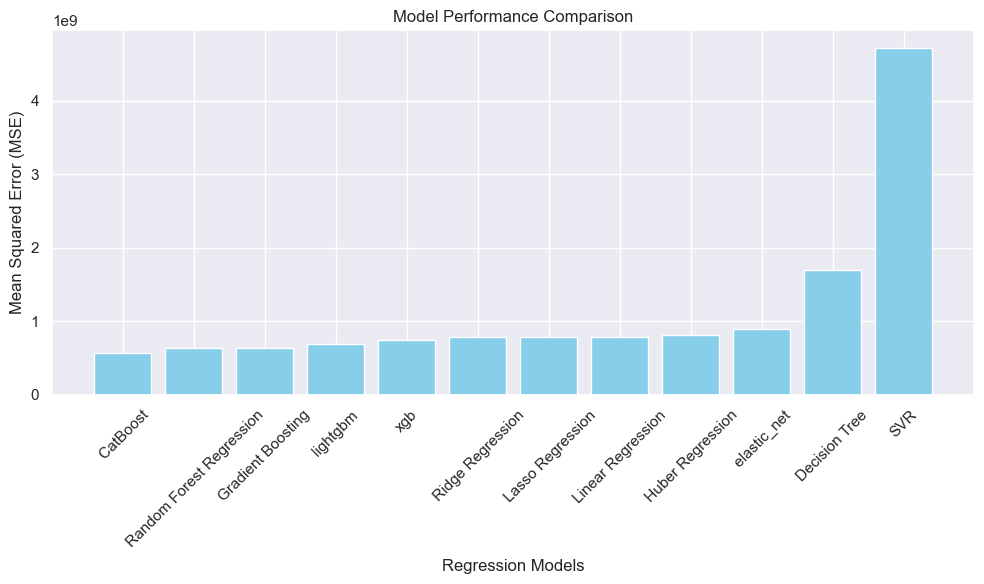

In [318]:

plt.figure(figsize=(10, 6))
plt.bar(sorted_model_names, sorted_mse_values, color='skyblue')
plt.xlabel('Regression Models')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Model Performance Comparison')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


In [319]:
print("Best Three Models:")
for model, mse in zip(best_three_models, best_three_mses):
    print(f"{model}: MSE = {mse}")

Best Three Models:
 CatBoost: MSE = 567566473.1219497
 Random Forest Regression: MSE = 634495758.1701175
Gradient Boosting: MSE = 636531179.6030816


## Apply Grid search  & Random Search for the best Models

# 1. Hyperparameter Tuning for Gradient Boosting


In [320]:
gb_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

gb_model = GradientBoostingRegressor(random_state=42)
gb_grid_search = GridSearchCV(gb_model, gb_param_grid, cv=5, scoring='neg_mean_squared_error')
gb_grid_search.fit(X_train, y_train)

gb_random_search = RandomizedSearchCV(gb_model, gb_param_grid, n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=42)
gb_random_search.fit(X_train, y_train)

# Select the best model and calculate MSE
best_gb_model_grid = gb_grid_search.best_estimator_
best_gb_model_random = gb_random_search.best_estimator_
gb_mse_grid = mean_squared_error(y_test, best_gb_model_grid.predict(X_test))
gb_mse_random = mean_squared_error(y_test, best_gb_model_random.predict(X_test))

print("Gradient Boosting:")
print("Grid Search - Best Params:", gb_grid_search.best_params_)
print("Grid Search - MSE:", gb_mse_grid)
print("Random Search - Best Params:", gb_random_search.best_params_)
print("Random Search - MSE:", gb_mse_random)

Gradient Boosting:
Grid Search - Best Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Grid Search - MSE: 635797489.5921663
Random Search - Best Params: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Random Search - MSE: 635797489.5921663


# 2. Hyperparameter Tuning for XGBoost


In [321]:
xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

xgb_model = XGBRegressor(random_state=42)
xgb_grid_search = GridSearchCV(xgb_model, xgb_param_grid, cv=5, scoring='neg_mean_squared_error')
xgb_grid_search.fit(X_train, y_train)

xgb_random_search = RandomizedSearchCV(xgb_model, xgb_param_grid, n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=42)
xgb_random_search.fit(X_train, y_train)

# Select the best model and calculate MSE
best_xgb_model_grid = xgb_grid_search.best_estimator_
best_xgb_model_random = xgb_random_search.best_estimator_
xgb_mse_grid = mean_squared_error(y_test, best_xgb_model_grid.predict(X_test))
xgb_mse_random = mean_squared_error(y_test, best_xgb_model_random.predict(X_test))

print("\nXGBoost:")
print("Grid Search - Best Params:", xgb_grid_search.best_params_)
print("Grid Search - MSE:", xgb_mse_grid)
print("Random Search - Best Params:", xgb_random_search.best_params_)
print("Random Search - MSE:", xgb_mse_random)


XGBoost:
Grid Search - Best Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Grid Search - MSE: 607794383.6338335
Random Search - Best Params: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Random Search - MSE: 607794383.6338335


# 3. Hyperparameter Tuning for Ridge Regression

In [322]:
ridge_param_grid = {
    'alpha': np.logspace(-3, 3, 7)
}

ridge_model = Ridge()
ridge_grid_search = GridSearchCV(ridge_model, ridge_param_grid, cv=5, scoring='neg_mean_squared_error')
ridge_grid_search.fit(X_train, y_train)

ridge_random_search = RandomizedSearchCV(ridge_model, ridge_param_grid, n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=42)
ridge_random_search.fit(X_train, y_train)

# Select the best model and calculate MSE
best_ridge_model_grid = ridge_grid_search.best_estimator_
best_ridge_model_random = ridge_random_search.best_estimator_
ridge_mse_grid = mean_squared_error(y_test, best_ridge_model_grid.predict(X_test))
ridge_mse_random = mean_squared_error(y_test, best_ridge_model_random.predict(X_test))

print("\nRidge Regression:")
print("Grid Search - Best Params:", ridge_grid_search.best_params_)
print("Grid Search - MSE:", ridge_mse_grid)
print("Random Search - Best Params:", ridge_random_search.best_params_)
print("Random Search - MSE:", ridge_mse_random)


Ridge Regression:
Grid Search - Best Params: {'alpha': 10.0}
Grid Search - MSE: 789363357.5369636
Random Search - Best Params: {'alpha': 10.0}
Random Search - MSE: 789363357.5369636


# 4. Hyperparameter Tuning for Random Forest Regression

In [323]:
# Create a Random Forest Regression model
rf_regressor = RandomForestRegressor()

# Define a grid of hyperparameters to search
param_grid = {
    'n_estimators': [10, 50, 100],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform Grid Search
grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and corresponding MSE score
print("Grid Search - Best Hyperparameters:")
print(grid_search.best_params_)
print("Grid Search - Best Mean Squared Error (MSE):")
print(-grid_search.best_score_)  # Negative because GridSearchCV uses neg_mean_squared_error

# Define a random hyperparameter search space
param_dist = {
    'n_estimators': np.arange(10, 101, 10),
    'max_depth': [None] + list(np.arange(10, 31, 5)),
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4, 6]
}

# Perform Randomized Search
random_search = RandomizedSearchCV(estimator=rf_regressor, param_distributions=param_dist, n_iter=20, cv=5, scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train, y_train)

# Print the best hyperparameters and corresponding MSE score
print("\nRandomized Search - Best Hyperparameters:")
print(random_search.best_params_)
print("Randomized Search - Best Mean Squared Error (MSE):")
print(-random_search.best_score_)

Grid Search - Best Hyperparameters:
{'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Grid Search - Best Mean Squared Error (MSE):
620840790.4356997

Randomized Search - Best Hyperparameters:
{'n_estimators': 80, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': None}
Randomized Search - Best Mean Squared Error (MSE):
647022923.8828863


# 5. Hyperparameter Tuning for LightBGM Regression

In [324]:

# # Define the parameter grid for Grid Search
# param_grid = {
#     'max_depth': [2, 5, 8, 10],
#     'learning_rate': [0.001, 0.01, 0.1, 0.2],
#     'n_estimators': [100, 300, 500, 1000, 1500],
#     'lambda_l1': [0.0001, 0.001, 0.01],
#     'lambda_l2': [0, 0.0001, 0.001, 0.01],
#     'feature_fraction': [0.4, 0.6, 0.8],
#     'min_child_samples': [5, 10, 20, 25]
# }

# # Define the parameter distributions for Random Search
# param_distributions = {
#     'max_depth': stats.randint(2, 11),
#     'learning_rate': stats.uniform(0.001, 0.2 - 0.001),
#     'n_estimators': stats.randint(100, 1501),
#     'lambda_l1': stats.uniform(0.0001, 0.01 - 0.0001),
#     'lambda_l2': stats.uniform(0, 0.01),
#     'feature_fraction': stats.uniform(0.4, 0.8 - 0.4),
#     'min_child_samples': stats.randint(5, 26)
# }

# # Create a LightGBM Regressor
# lgbm = lgb.LGBMRegressor()

# # Create a GridSearchCV object
# grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid,
#                            scoring='neg_mean_squared_error',
#                            cv=5)

# # Create a RandomizedSearchCV object
# random_search = RandomizedSearchCV(estimator=lgbm,
#                                    param_distributions=param_distributions,
#                                    n_iter=100,
#                                    scoring='neg_mean_squared_error',
#                                    cv=5,
#                                    random_state=42)

# # Fit both searches to your data
# grid_search.fit(X_train, y_train)
# random_search.fit(X_train, y_train)

# # Get the best parameters and best estimator from both searches
# best_params_grid = grid_search.best_params_
# best_estimator_grid = grid_search.best_estimator_

# best_params_random = random_search.best_params_
# best_estimator_random = random_search.best_estimator_

# # Fit the best models on the training data
# best_estimator_grid.fit(X_train, y_train)
# best_estimator_random.fit(X_train, y_train)

# # Make predictions on the test data
# y_pred_grid = best_estimator_grid.predict(X_test)
# y_pred_random = best_estimator_random.predict(X_test)

# # Calculate MSE for both models
# mse_grid = mean_squared_error(y_test, y_pred_grid)
# mse_random = mean_squared_error(y_test, y_pred_random)

# print("MSE for Grid Search:", mse_grid)
# print("MSE for Random Search:", mse_random)

# 6. Hyperparameter Tuning for catboost Regression

In [352]:

# Define the parameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'depth': [4, 6, 8],
    'iterations': [500, 1000, 1500]
}

# Create the CatBoostRegressor model
catboost_model = CatBoostRegressor()

# Perform GridSearchCV to find the best parameters
grid_search = GridSearchCV(estimator=catboost_model, param_grid=param_grid, 
                           scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

# Find the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = catboost_model.predict(x_test)
results_df = pd.DataFrame({'Id': id, 'SalePrice':y_pred})
results_df.to_csv('house_prices_catboost_regressor.csv', index=False)

0:	learn: 72274.7398744	total: 688us	remaining: 343ms
1:	learn: 71851.8846459	total: 1.49ms	remaining: 370ms
2:	learn: 71399.7573694	total: 2.02ms	remaining: 334ms
3:	learn: 70957.6822340	total: 2.51ms	remaining: 312ms
4:	learn: 70535.7206302	total: 2.97ms	remaining: 294ms
5:	learn: 70064.2769433	total: 3.47ms	remaining: 286ms
6:	learn: 69651.3210932	total: 3.96ms	remaining: 279ms
7:	learn: 69262.2944076	total: 4.43ms	remaining: 272ms
8:	learn: 68803.7890617	total: 5.06ms	remaining: 276ms
9:	learn: 68356.2570170	total: 5.54ms	remaining: 271ms
10:	learn: 67966.2498064	total: 6.03ms	remaining: 268ms
11:	learn: 67538.2414513	total: 6.54ms	remaining: 266ms
12:	learn: 67130.1460019	total: 7.02ms	remaining: 263ms
13:	learn: 66683.1852630	total: 7.48ms	remaining: 260ms
14:	learn: 66285.5067489	total: 7.94ms	remaining: 257ms
15:	learn: 65896.8348289	total: 8.4ms	remaining: 254ms
16:	learn: 65494.3971160	total: 8.9ms	remaining: 253ms
17:	learn: 65088.4330936	total: 9.4ms	remaining: 252ms
18:	le

CatBoostError: There is no trained model to use predict(). Use fit() to train model. Then use this method.

## Prepare test data

In [326]:
id=test["Id"]

In [327]:
# Get the columns as 1-dimensional arrays (Series)
columns_test = test.columns
columns_df = df_best_num.columns

# Find the intersection of columns
common_columns = columns_test.intersection(columns_df)

# Create a new DataFrame containing only the common columns from df1
test_num = test[common_columns].copy()

In [328]:
test_num.isna().sum()

OverallQual      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea      15
BsmtFinSF1       1
1stFlrSF         0
GrLivArea        0
FullBath         0
GarageCars       1
dtype: int64

In [329]:
test_imputed = knn_imputer.fit_transform(test_num)

# Convert the result back to a DataFrame (if necessary)
test_num = pd.DataFrame(test_imputed, columns=test_num.columns)

Imputing row 1/1459 with 0 missing, elapsed time: 0.169
Imputing row 101/1459 with 0 missing, elapsed time: 0.169
Imputing row 201/1459 with 0 missing, elapsed time: 0.169
Imputing row 301/1459 with 0 missing, elapsed time: 0.170
Imputing row 401/1459 with 0 missing, elapsed time: 0.170
Imputing row 501/1459 with 0 missing, elapsed time: 0.170
Imputing row 601/1459 with 0 missing, elapsed time: 0.170
Imputing row 701/1459 with 0 missing, elapsed time: 0.171
Imputing row 801/1459 with 0 missing, elapsed time: 0.171
Imputing row 901/1459 with 0 missing, elapsed time: 0.171
Imputing row 1001/1459 with 0 missing, elapsed time: 0.171
Imputing row 1101/1459 with 0 missing, elapsed time: 0.171
Imputing row 1201/1459 with 0 missing, elapsed time: 0.171
Imputing row 1301/1459 with 0 missing, elapsed time: 0.172
Imputing row 1401/1459 with 0 missing, elapsed time: 0.172


In [330]:
test_num.isna().sum()

OverallQual     0
YearBuilt       0
YearRemodAdd    0
MasVnrArea      0
BsmtFinSF1      0
1stFlrSF        0
GrLivArea       0
FullBath        0
GarageCars      0
dtype: int64

In [331]:
test_num = test_num[df_best_num.columns]
normalized_numerical_columns = scaler.transform(test_num)
test_num[df_best_num.columns] = normalized_numerical_columns


In [332]:
# Find the intersection of columns
catg_columns = columns_test.intersection(relevant_columns)

# Create a new DataFrame containing only the common columns from df1
test_catg = test[catg_columns].copy()
# relevant_columns

In [333]:
test_catg

,LotShape,Neighborhood,HouseStyle,Exterior1st,Exterior2nd,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish
0,Reg,NAmes,1Story,VinylSd,VinylSd,None,TA,CBlock,TA,No,Rec,TA,TA,Attchd,Unf
1,IR1,NAmes,1Story,Wd Sdng,Wd Sdng,BrkFace,TA,CBlock,TA,No,ALQ,TA,Gd,Attchd,Unf
2,IR1,Gilbert,2Story,VinylSd,VinylSd,None,TA,PConc,Gd,No,GLQ,Gd,TA,Attchd,Fin
3,IR1,Gilbert,2Story,VinylSd,VinylSd,BrkFace,TA,PConc,TA,No,GLQ,Ex,Gd,Attchd,Fin
4,IR1,StoneBr,1Story,HdBoard,HdBoard,None,Gd,PConc,Gd,No,ALQ,Ex,Gd,Attchd,RFn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,Reg,MeadowV,2Story,CemntBd,CmentBd,None,TA,CBlock,TA,No,Unf,Gd,TA,NaN,NaN
1455,Reg,MeadowV,2Story,CemntBd,CmentBd,None,TA,CBlock,TA,No,Rec,TA,TA,CarPort,Unf
1456,Reg,Mitchel,1Story,VinylSd,VinylSd,None,TA,CBlock,TA,No,ALQ,Ex,TA,Detchd,Unf
1457,Reg,Mitchel,SFoyer,HdBoard,Wd Shng,None,TA,PConc,Gd,Av,GLQ,TA,TA,NaN,NaN


In [334]:
test_catg = test_catg.drop('Neighborhood', axis=1)
test_catg=test_catg.drop('MasVnrType', axis=1)

In [335]:
for material in test_catg['Exterior1st'].unique():
    test_catg[f'Has_{material}_Exterior'] = (test_catg['Exterior1st'] == material) | (test_catg['Exterior2nd'] == material)
test_catg.drop(['Exterior1st', 'Exterior2nd'], axis=1, inplace=True)


In [336]:
test_catg = test_catg.drop('Has_BrkFace_Exterior', axis=1)
test_catg = test_catg.drop('Has_WdShing_Exterior', axis=1)
test_catg = test_catg.drop('Has_CemntBd_Exterior', axis=1)
test_catg = test_catg.drop('Has_Plywood_Exterior', axis=1)
test_catg = test_catg.drop('Has_AsbShng_Exterior', axis=1)
test_catg = test_catg.drop('Has_Stucco_Exterior', axis=1)
test_catg = test_catg.drop('Has_BrkComm_Exterior', axis=1)
test_catg = test_catg.drop('Has_AsphShn_Exterior', axis=1)
test_catg = test_catg.drop('Has_CBlock_Exterior', axis=1)
test_catg = test_catg.drop('Has_nan_Exterior', axis=1)

In [337]:
test_catg.isna().sum()

LotShape                 0
HouseStyle               0
ExterQual                0
Foundation               0
BsmtQual                44
BsmtExposure            44
BsmtFinType1            42
HeatingQC                0
KitchenQual              1
GarageType              76
GarageFinish            78
Has_VinylSd_Exterior     0
Has_Wd Sdng_Exterior     0
Has_HdBoard_Exterior     0
Has_MetalSd_Exterior     0
dtype: int64

In [338]:
test_catg['BsmtQual'].fillna(df_catg['BsmtQual'].mode()[0], inplace=True)
test_catg['BsmtExposure'].fillna(df_catg['BsmtExposure'].mode()[0], inplace=True)
test_catg['BsmtFinType1'].fillna(df_catg['BsmtFinType1'].mode()[0], inplace=True)
test_catg['KitchenQual'].fillna(df_catg['KitchenQual'].mode()[0], inplace=True)
test_catg['GarageType'].fillna(df_catg['GarageType'].mode()[0], inplace=True)
test_catg['GarageFinish'].fillna(df_catg['GarageFinish'].mode()[0], inplace=True)

In [339]:
test_catg["GarageType"]= pd.DataFrame(map(buk_GarageType,test_catg["GarageType"]))
test_catg["Foundation"]= pd.DataFrame(map(buk_Foundation,test_catg["Foundation"]))

In [340]:
GarageType=pd.get_dummies(test_catg["GarageType"],drop_first=True)
test_catg=pd.concat([test_catg,GarageType],axis=1)
test_catg = test_catg.drop('GarageType', axis=1)
test_catg = test_catg.drop('other', axis=1)
Foundation=pd.get_dummies(test_catg["Foundation"],drop_first=True)
test_catg=pd.concat([test_catg,Foundation],axis=1)
test_catg = test_catg.drop('Foundation', axis=1)

In [341]:
# test_catg
qual_label.fit(test_catg[["ExterQual"]])
test_catg["ExterQual"]=pd.DataFrame(qual_label.transform(test_catg[["ExterQual"]]))
qual_label.fit(test_catg[["BsmtQual"]])
test_catg["BsmtQual"]=pd.DataFrame(qual_label.transform(test_catg[["BsmtQual"]]))
qual_label.fit(test_catg[["KitchenQual"]])
test_catg["KitchenQual"]=pd.DataFrame(qual_label.transform(test_catg[["KitchenQual"]]))
BsmtExposure_label.fit(test_catg[["BsmtExposure"]])
test_catg["BsmtExposure"]=pd.DataFrame(BsmtExposure_label.transform(test_catg[["BsmtExposure"]]))
BsmtFinType1_label.fit(test_catg[["BsmtFinType1"]])
test_catg["BsmtFinType1"]=pd.DataFrame(BsmtFinType1_label.transform(test_catg[["BsmtFinType1"]]))
GarageFinish_label.fit(test_catg[["GarageFinish"]])
test_catg["GarageFinish"]=pd.DataFrame(GarageFinish_label.transform(test_catg[["GarageFinish"]]))
LotShape_label.fit(test_catg[["LotShape"]])
test_catg["LotShape"]=pd.DataFrame(LotShape_label.transform(test_catg[["LotShape"]]))
HouseStyle_label.fit(test_catg[["HouseStyle"]])
test_catg["HouseStyle"]=pd.DataFrame(HouseStyle_label.transform(test_catg[["HouseStyle"]]))
HeatingQC_label.fit(test_catg[["HeatingQC"]])
test_catg["HeatingQC"]=pd.DataFrame(HeatingQC_label.transform(test_catg[["HeatingQC"]]))

In [342]:
label_encoder = LabelEncoder()

test_catg['Has_Wd Sdng_Exterior'] = label_encoder.fit_transform(test_catg['Has_Wd Sdng_Exterior'])
label_encoder = LabelEncoder()

test_catg['Has_HdBoard_Exterior'] = label_encoder.fit_transform(test_catg['Has_HdBoard_Exterior'])
label_encoder = LabelEncoder()

test_catg['Has_MetalSd_Exterior'] = label_encoder.fit_transform(test_catg['Has_MetalSd_Exterior'])
label_encoder = LabelEncoder()

# Fit and transform the boolean column
test_catg['Has_VinylSd_Exterior'] = label_encoder.fit_transform(test_catg['Has_VinylSd_Exterior'])



In [343]:
x_test=df = pd.concat([test_catg, test_num],axis=1)

In [344]:
x_test.columns
x_test.reset_index()

,index,LotShape,HouseStyle,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageFinish,...,others,MasVnrArea,BsmtFinSF1,YearRemodAdd,YearBuilt,FullBath,1stFlrSF,GarageCars,GrLivArea,OverallQual
0,0,3.0,1.0,1.0,1.0,0.0,2.0,2.0,1.0,0.0,...,0,-0.584861,0.066083,-1.160748,-0.347600,-1.034723,-0.707190,-1.033498,-1.260093,-0.804034
1,1,2.0,1.0,1.0,1.0,0.0,4.0,2.0,2.0,0.0,...,0,0.046821,1.124073,-1.306660,-0.447713,-1.034723,0.478251,-1.033498,-0.351696,-0.057282
2,2,2.0,6.0,1.0,2.0,0.0,5.0,3.0,1.0,2.0,...,0,-0.584861,0.817140,0.638830,0.853747,0.822340,-0.619583,0.321197,0.277678,-0.804034
3,3,2.0,6.0,1.0,1.0,0.0,5.0,4.0,2.0,2.0,...,0,-0.467883,0.377667,0.638830,0.887118,0.822340,-0.625058,0.321197,0.225230,-0.057282
4,4,2.0,1.0,2.0,2.0,0.0,4.0,4.0,2.0,1.0,...,0,-0.584861,-0.410593,0.347007,0.686893,0.822340,0.344102,0.321197,-0.454494,1.436221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,1454,3.0,6.0,1.0,1.0,0.0,0.0,3.0,1.0,0.0,...,0,-0.584861,-1.022135,-0.723013,-0.047264,-1.034723,-1.665399,-2.388194,-0.848902,-1.550785
1455,1455,3.0,6.0,1.0,1.0,0.0,2.0,2.0,1.0,0.0,...,0,-0.584861,-0.436171,-0.723013,-0.047264,-1.034723,-1.665399,-1.033498,-0.848902,-1.550785
1456,1456,3.0,1.0,1.0,1.0,0.0,4.0,4.0,1.0,0.0,...,0,-0.584861,1.823974,0.541556,-0.380971,-1.034723,0.190788,0.321197,-0.571977,-0.804034
1457,1457,3.0,4.0,1.0,2.0,2.0,5.0,2.0,1.0,0.0,...,0,-0.584861,-0.238525,0.347007,0.686893,-1.034723,-0.504598,-2.388194,-1.104847,-0.804034


In [345]:
x.columns
x.reset_index()

,index,LotShape,HouseStyle,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageFinish,...,YearBuilt,FullBath,1stFlrSF,GarageCars,GrLivArea,OverallQual,CBlock,PConc,others,Detchd
0,0,3.0,6.0,2.0,2.0,0.0,5.0,4.0,2.0,1.0,...,1.053972,0.822340,-0.816700,0.321197,0.447609,0.689469,0,1,0,0
1,1,3.0,1.0,1.0,2.0,3.0,4.0,4.0,1.0,1.0,...,0.152961,0.822340,0.294823,0.321197,-0.492256,-0.057282,1,0,0,0
2,2,2.0,6.0,2.0,2.0,1.0,5.0,4.0,2.0,1.0,...,0.987230,0.822340,-0.641485,0.321197,0.607051,0.689469,0,1,0,0
3,3,2.0,6.0,1.0,1.0,0.0,4.0,3.0,2.0,0.0,...,-1.882656,-1.034723,-0.529237,1.675892,0.462295,0.689469,0,0,0,1
4,4,2.0,6.0,2.0,2.0,2.0,5.0,4.0,2.0,1.0,...,0.953859,0.822340,-0.025493,1.675892,1.471391,1.436221,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,1429,3.0,6.0,1.0,2.0,0.0,0.0,4.0,1.0,1.0,...,0.920489,0.822340,-0.551139,0.321197,0.315441,-0.057282,0,1,0,0
1430,1430,3.0,1.0,1.0,2.0,0.0,4.0,2.0,1.0,0.0,...,0.219702,0.822340,2.515130,0.321197,1.209152,-0.057282,1,0,0,0
1431,1431,3.0,6.0,3.0,1.0,0.0,5.0,4.0,2.0,1.0,...,-1.015016,0.822340,0.092230,-1.033498,1.769295,0.689469,0,0,1,0
1432,1432,3.0,1.0,1.0,1.0,1.0,5.0,3.0,2.0,0.0,...,-0.714679,-1.034723,-0.208922,-1.033498,-0.878273,-0.804034,1,0,0,0


In [346]:
# Rearrange the columns in the test DataFrame to match the order in test_num
x_test = x_test[x.columns]
x_test.columns.astype(str)

Index(['LotShape', 'HouseStyle', 'ExterQual', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'GarageFinish',
       'Has_VinylSd_Exterior', 'Has_MetalSd_Exterior', 'Has_Wd Sdng_Exterior',
       'Has_HdBoard_Exterior', 'MasVnrArea', 'BsmtFinSF1', 'YearRemodAdd',
       'YearBuilt', 'FullBath', '1stFlrSF', 'GarageCars', 'GrLivArea',
       'OverallQual', 'CBlock', 'PConc', 'others', 'Detchd'],
      dtype='object')

###### Since Gradient Boosting and XGBoost and Random Forest Regression have nearly identical MSE values, we'll train both on the entire dataset. Then, we'll compare their performance using MSE, and pick the one with the lower MSE as our final choice. If they're still very close, we'll consider other factors like simplicity or computational efficiency to decide.

## Applying best Models on the whole dataset
### XGBoost


In [347]:
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100,learning_rate=0.1, max_depth=3)
xgb_regressor.fit(x,y)
xgb_regressor_y_pred=xgb_regressor.predict(x_test)
results_df = pd.DataFrame({'Id': id, 'SalePrice': xgb_regressor_y_pred})
results_df.to_csv('house_prices_xgb_regressor.csv', index=False)

### Random Forest Regression

In [348]:
rf_regressor = RandomForestRegressor(max_depth= None, min_samples_leaf=2,min_samples_split=5,n_estimators=100)
rf_regressor.fit(x,y)
rf_regressor_y_pred = rf_regressor.predict(x_test)
results_df = pd.DataFrame({'Id': id, 'SalePrice':rf_regressor_y_pred})
results_df.to_csv('house_prices_rf_regressor.csv', index=False)

### Gradient Boosting Regressor

In [349]:
gb_regressor = GradientBoostingRegressor(n_estimators= 100, max_depth= 3, learning_rate= 0.1)
# Fit the model to the training data
gb_regressor.fit(x,y)
gb_regressor_y_pred=gb_regressor.predict(x_test)
results_df = pd.DataFrame({'Id': id, 'SalePrice':gb_regressor_y_pred})
results_df.to_csv('house_prices_gb_regressor.csv', index=False)

### LGB Regressor

In [350]:
params = {
    'objective': 'regression',  # 'regression' for regression tasks
    'boosting_type': 'gbdt',   # Gradient Boosting Decision Tree
    'metric': 'mse',           # Mean Squared Error (MSE) as the evaluation metric
    'num_leaves': 31,          # Number of leaves in each tree
    'learning_rate': 0.05,     # Learning rate
    'feature_fraction': 0.9,  # Fraction of features to be used in each iteration
    'bagging_fraction': 0.8,  # Fraction of data to be used in each iteration (bagging)
    'bagging_freq': 5,         # Frequency of bagging
    'verbose': 0               # Control the level of verbosity (0 for no output)
}

# Train the LightGBM model
num_round = 100  # Number of boosting rounds (iterations)
# Create a LightGBM dataset
train_data = lgb.Dataset(X_train, label=y_train)
bst = lgb.train(params, train_data, num_round)

# Make predictions on the test data
y_pred = bst.predict(x_test, num_iteration=bst.best_iteration)
results_df = pd.DataFrame({'Id': id, 'SalePrice':y_pred})
results_df.to_csv('house_prices_lgb_regressor.csv', index=False)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


### catboost  Regressor

In [351]:
from catboost import CatBoostRegressor
# Create and train the CatBoostRegressor model
catboost_model = CatBoostRegressor()
catboost_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = catboost_model.predict(x_test)
results_df = pd.DataFrame({'Id': id, 'SalePrice':y_pred})
results_df.to_csv('house_prices_catboost_regressor.csv', index=False)

Learning rate set to 0.04184
0:	learn: 69881.9320998	total: 1.6ms	remaining: 1.6s
1:	learn: 67896.0826800	total: 2.58ms	remaining: 1.29s
2:	learn: 65933.8883319	total: 3.59ms	remaining: 1.19s
3:	learn: 64147.5027817	total: 4.6ms	remaining: 1.15s
4:	learn: 62412.4726057	total: 5.59ms	remaining: 1.11s
5:	learn: 60886.8191125	total: 6.52ms	remaining: 1.08s
6:	learn: 59188.3119234	total: 7.46ms	remaining: 1.06s
7:	learn: 57614.5843337	total: 8.45ms	remaining: 1.05s
8:	learn: 56172.0027428	total: 9.44ms	remaining: 1.04s
9:	learn: 54719.6805333	total: 10.4ms	remaining: 1.02s
10:	learn: 53395.8101388	total: 11.3ms	remaining: 1.02s
11:	learn: 52123.8927838	total: 12.3ms	remaining: 1.01s
12:	learn: 50982.4733122	total: 13.1ms	remaining: 995ms
13:	learn: 49767.7729557	total: 14.1ms	remaining: 992ms
14:	learn: 48550.6624025	total: 15ms	remaining: 986ms
15:	learn: 47409.7893290	total: 16ms	remaining: 984ms
16:	learn: 46342.1499354	total: 17ms	remaining: 984ms
17:	learn: 45277.1864065	total: 17.9ms